In [1]:
import numpy as np
import scipy as sp
from astropy.io import fits
import matplotlib.pyplot as plt
import PIL
from PIL import Image
from scipy.ndimage import correlate
import matplotlib.colors as colors
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
from matplotlib.colors import LogNorm
from scipy.ndimage import gaussian_filter
from scipy.spatial import Delaunay
from scipy.spatial import cKDTree
from scipy.spatial import KDTree
from scipy.interpolate import griddata
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from scipy.optimize import leastsq
import seaborn as sns
import warnings
import matplotlib.image as mpimg
from datetime import date
warnings.filterwarnings('ignore')
print(sns.__version__)
from photutils import source_properties, EllipticalAperture
from astropy.table import QTable, Table, Column
from astropy import units as u
import os
from scipy.ndimage import gaussian_filter, gaussian_laplace
#from pyHIIExplorerV2.HIIblob import *

from pyHIIExplorer.HIIblob import *
from pyHIIExplorer.extract import *
import seaborn as sns
import argparse
from matplotlib import rcParams as rc
warnings.filterwarnings('ignore')

import pandas as pd
from Sewpy.sewpy import SEW
import time
print('Import done')
%matplotlib inline

#
# Only for plotting
#
def add_colorbar(im, aspect=20, pad_fraction=0.5, **kwargs):
    """Add a vertical color bar to an image plot."""
    divider = axes_grid1.make_axes_locatable(im.axes)
    width = axes_grid1.axes_size.AxesY(im.axes, aspect=1./aspect)
    pad = axes_grid1.axes_size.Fraction(pad_fraction, width)
    current_ax = plt.gca()
    cax = divider.append_axes("right", size=width, pad=pad)
    plt.sca(current_ax)
    return im.axes.figure.colorbar(im, cax=cax, **kwargs)
from mpl_toolkits import axes_grid1

from matplotlib import rcParams as rc
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
          })


0.8.1
Import done


In [2]:
#pyHIIExplorer.HIIblob
import pyHIIExplorer
pyHIIExplorer

<module 'pyHIIExplorer' from '/home/alugo/anaconda3/lib/python3.6/site-packages/pyHIIExplorer/__init__.py'>

In [3]:
def create_whan(x_plt1, y_plt1, cmap1, c1,  x_min, x_max, y_min, y_max, name, DIR):
    
    fig = plt.figure()
    
    maska1 = (x_plt1>=-5000)&(x_plt1<=5000)&(y_plt1>=-5000)&(y_plt1<=5000)
    x_plt1 = x_plt1[maska1]
    y_plt1 = y_plt1[maska1]
    df = pd.DataFrame({"x":x_plt1,"y":y_plt1})
    ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap=cmap1, vmin=0, vmax=200, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color": c1, "alpha": 0.9}, levels=[0.15, 0.5, 0.99])
    
    ax.ax_joint.legend_.remove()
    ax.set_axis_labels(r'log([NII]/H$\alpha$)', r'log W$_{H\alpha}$ ($\AA$)', size=32)

    ax.ax_joint.plot((-0.14,-0.14), (0.5,y_max) ,c='#646464', ls="--", linewidth=2)
    ax.ax_joint.plot((-0.14,x_max), (0.79,0.79), c='#646464', ls="--", linewidth=2)
    ax.ax_joint.plot((x_min,x_max), (0.5,0.5), c='#646464', ls="--", linewidth=2)


    plt.text(0.25, 1.0, 'SF', fontsize=38, fontweight=800,transform=fig.transFigure)
    plt.text(0.6, 1.0, 'sAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
    plt.text(0.6, 0.6, 'wAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
    plt.text(0.25, 0.3, 'Retired', fontsize=38, fontweight=800, transform=fig.transFigure)

    plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
    plt.savefig(DIR+'/'+name+".png")
    plt.savefig(DIR+'/'+name+".pdf")
    
    plt.show()
    return fig



In [4]:
def create_bpt_sns_single (x_plt, y_plt, cmap, c, x_min1,x_max1, y_min1, y_max1, legend, namesave, DIR):  #counts
    x=np.linspace(x_min1,x_max1,500)
    cut_y=-0.7+0.2-3.67*x
    cut_y2=-1.7+0.5-3.67*x
    cut_y3=0.61/(x-0.05)+1.3
    cut_y4=0.61/(x-0.47)+1.19
    cut_y5_ce=0.13/(x-0.003)+0.57
    cut_y_SII=0.72/(x-0.32)+1.3;
    cut_y_SII_ce=0.04/(x+0.012)+0.58
    cut_y_SII_AGNs=1.89*(x)+0.76;
    cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
    cut_y_OI_AGNs=1.18*(x)+1.30;
    cut_y_OI_ce=0.056/(x+0.40)+0.61
    cut_y_OIII_AGNs=1.14*(x)+0.36;
    
    fig = plt.figure()
    maska1 = (x_plt>=-5000)&(x_plt<=5000)& (y_plt>=-5000)&(y_plt<=5000)
    x_plt = x_plt[maska1]
    y_plt = y_plt[maska1]
    df = pd.DataFrame({"x":x_plt,"y":y_plt})
    ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap=cmap, vmin=0,vmax=200,  xlim=[x_min1+2,x_max1+0.1], ylim=[y_min1,y_max1],shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color": c, "alpha": 0.9}, levels=[0.15, 0.5, 0.99])
                   
                   #joint_kws={'weights':counts})
    
    ax.ax_joint.plot(x[x<-0.01], cut_y3[x<-0.01], '#D6A02B', linestyle='--', linewidth=3)
    ax.ax_joint.plot(x,cut_y4, c='#006476',linestyle='-.',linewidth=3)
    ax.ax_joint.plot(x[x<-0.01],cut_y5_ce[x<-0.01],c="#3b001d", linestyle=':',linewidth=3)

    ax.ax_joint.legend_.remove()
    ax.set_axis_labels(r'log([NII]/H$\alpha$)',r'log([OIII]/H$\beta$)', size=32)

    plt.subplots_adjust(left=0.17, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
   # plt.legend([legend],  loc='3',bbox_to_anchor=(-1.2, 0.3), prop={'size': 22})
    plt.savefig(DIR+'/'+namesave+".png")
    plt.savefig(DIR+'/'+namesave+".pdf")
    
    plt.show()
    return fig



# FWHM =  5.0
# 1sig Ha-map =  0.005312216357189367 ; 1sig MUSE-V  -1
# HII reg. Initial =  1680
# HII reg. 2nd =  1586
# HII reg. additional =  118
# Last iteration Num. =  1627
# Clean above 3sigma Num =  1609
# X_sqr =  54.24613660554351
# HII reg clean= 1609


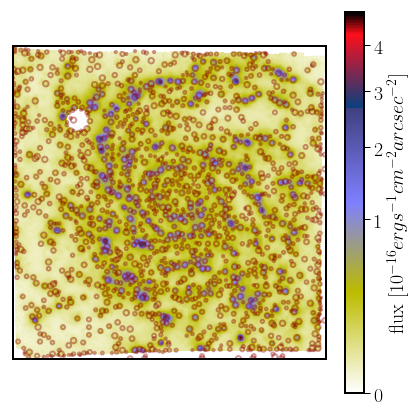

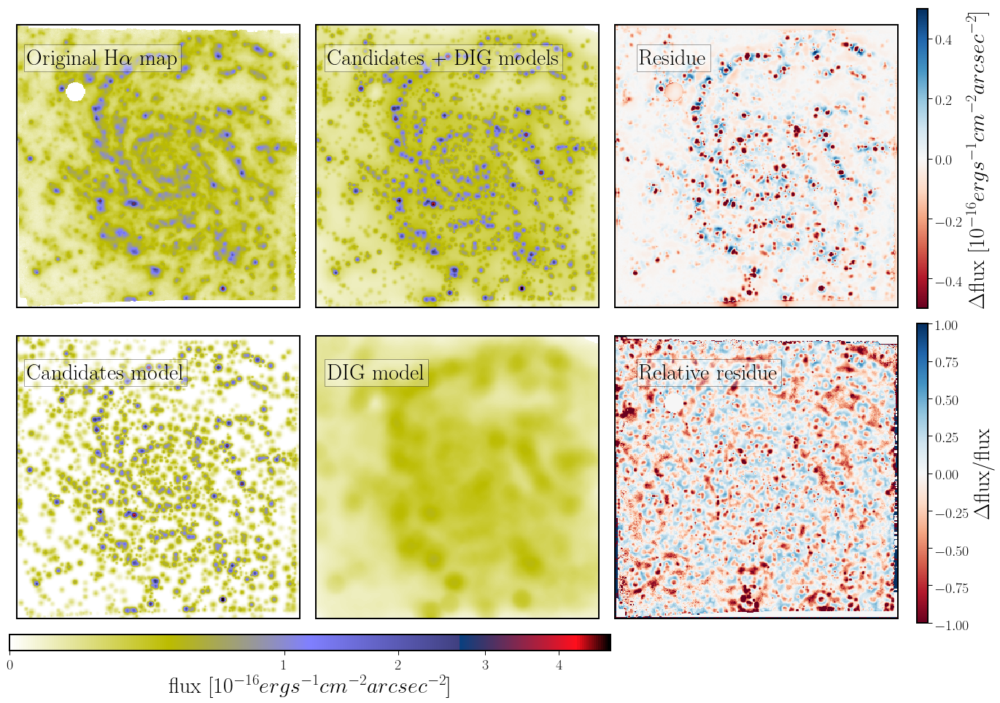

In [5]:
#        x_g = np.arange(0,nx_sec,1)
#        y_g = np.arange(0,ny_sec,1)  #    tri_MUSE = Delaunay(points_MUSE)
#    diff_p_MUSE = np.zeros((len(tri_MUSE.simplices),2))


##################################################################
# Our method

#name="NGC2906"
name="NGC4030"
#
#name = 'HCG91c'
DIR="datos_muse"
file="datos_muse/flux_elines_long."+name+".cube.fits.gz"

#file=DIR+"/flux_elines."+name+".cube.fits.gz"
hdu_fe=fits.open(file)
data=hdu_fe[0].data
hdr_fe=hdu_fe[0].header

#F_Ha_MUSE=data[20,:,:]
#eF_Ha_MUSE=data[140,:,:]
#F_WHa_MUSE=data[110,:,:]

F_Ha_MUSE=data[67,:,:]
eF_Ha_MUSE=data[591,:,:]
F_WHa_MUSE=data[460,:,:]


file_SSP=DIR+"/"+name+".SSP.cube.fits.gz"
hdu=fits.open(file_SSP)
data_SSP=hdu[0].data
hdr=hdu[0].header
V_MUSE=data_SSP[0,:,:]
V_MUSE[V_MUSE==-1.0]=0.0

spax_sca_MUSE = 0.2
FWHM_MUSE = 1.0
FWHM_MUSE = FWHM_MUSE/spax_sca_MUSE
print("# FWHM = ", FWHM_MUSE)
#
# We detect the HII regions!
#
DIR = '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/'

blobs_final,blobs_F_Ha,image_HII,diff_map_final,diff_points,diff_Flux=HIIblob(F_Ha_MUSE,V_MUSE, 
                                                                              FWHM_MUSE, MUSE_1sig=0,
                                                                              MUSE_1sig_V=-1, plot=1, refined = 3, 
                                                                              num_sigma=300, DIG_lim=1,
                                                                              name=name, 
                                                                              max_size=2, DIR=DIR)


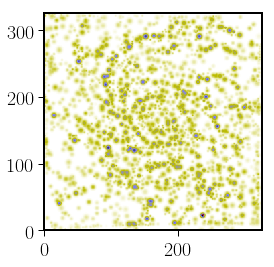

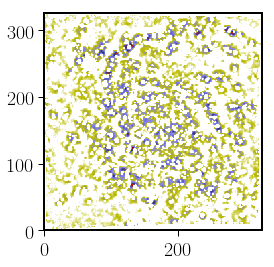

In [6]:
cmap = 'gist_stern_r'
(ny,nx) = F_Ha_MUSE.shape

plt.imshow(image_HII, interpolation='none',\
                                     cmap=cmap, label=r'Diffuse',\
                                  norm=colors.PowerNorm(gamma=0.5)) 
plt.xlim(0, nx)
plt.ylim(0,ny)
plt.show()

resi=F_Ha_MUSE-(image_HII+diff_map_final)

plt.imshow(resi, interpolation='none',\
                                     cmap=cmap, label=r'Diffuse',\
                                  norm=colors.PowerNorm(gamma=0.5)) 
plt.xlim(0, nx)
plt.ylim(0,ny)

plt.show()


In [7]:
WCS, hdu_HII_pyhiiv2, hdu_DIG_pyhiiv2, table_HII_pyhiiv2, table_DIG_pyhiiv2 = extracting_flux_elines('NGC4030_pyhiiexplorerV2', hdu_fe, blobs_final, 
                                                                                                     diff_points, FWHM_MUSE=1.0, 
                                                                                                     plot=0, def_DIG=0)


0   1048  val_now= flux_[FeIII]4754
1   1048  val_now= flux_[FeIII]4769
2   1048  val_now= flux_[FeII]4774
3   1048  val_now= flux_[FeIII]4777
4   1048  val_now= flux_[FeIII]4813
5   1048  val_now= flux_[FeII]4814
6   1048  val_now= flux_Hbeta4861
7   1048  val_now= flux_[FeIII]4881
8   1048  val_now= flux_[FeII]4889
9   1048  val_now= flux_[FeVII]4893
10   1048  val_now= flux_[FeII]4905
11   1048  val_now= flux_HeI4921
12   1048  val_now= flux_[FeIII]4924
13   1048  val_now= flux_[FeIII]4930
14   1048  val_now= flux_[FeVII]4942
15   1048  val_now= flux_[OIII]4958
16   1048  val_now= flux_[FeVI]4972
17   1048  val_now= flux_[FeII]4973
18   1048  val_now= flux_[FeIII]4985
19   1048  val_now= flux_[OIII]5006
20   1048  val_now= flux_HeI5015
21   1048  val_now= flux_[FeII]5039
22   1048  val_now= flux_[FeII]5072
23   1048  val_now= flux_[FeII]5107
24   1048  val_now= flux_[FeII]5111
25   1048  val_now= flux_[FeVI]5145
26   1048  val_now= flux_[FeII]5158
27   1048  val_now= flux_[FeVII]515

232   1048  val_now= vel_HI8345
233   1048  val_now= vel_[CrII]8357
234   1048  val_now= vel_HI8359
235   1048  val_now= vel_HI8374
236   1048  val_now= vel_HI8392
237   1048  val_now= vel_OI8446
238   1048  val_now= vel_HI8467
239   1048  val_now= vel_CaII8498
240   1048  val_now= vel_HI8502
241   1048  val_now= vel_CaII8542
242   1048  val_now= vel_HI8545
243   1048  val_now= vel_[ClII]8578
244   1048  val_now= vel_HI8598
245   1048  val_now= vel_[FeII]8616
246   1048  val_now= vel_CaII8662
247   1048  val_now= vel_HI8665
248   1048  val_now= vel_[CI]8727
249   1048  val_now= vel_HI8750
250   1048  val_now= vel_HI8862
251   1048  val_now= vel_[FeII]8891
252   1048  val_now= vel_HI9014
253   1048  val_now= vel_[FeII]9033
254   1048  val_now= vel_[FeII]9051
255   1048  val_now= vel_[SIII]9069
256   1048  val_now= vel_[ClII]9123
257   1048  val_now= vel_[FeII]9226
258   1048  val_now= vel_HI9229
259   1048  val_now= vel_OI9266
260   1048  val_now= vel_[FeII]9267
261   1048  val_now= vel

464   1048  val_now= EW_[SII]6730
465   1048  val_now= EW_FeI6855
466   1048  val_now= EW_[ArV]7005
467   1048  val_now= EW_HeI7065
468   1048  val_now= EW_[ArIII]7135
469   1048  val_now= EW_[FeII]7155
470   1048  val_now= EW_[FeII]7171
471   1048  val_now= EW_CII7236
472   1048  val_now= EW_HeI7281
473   1048  val_now= EW_[FeI]7290
474   1048  val_now= EW_[CaII]7291
475   1048  val_now= EW_[OII]7318
476   1048  val_now= EW_[CaII]7323
477   1048  val_now= EW_[OII]7329
478   1048  val_now= EW_[NiII]7377
479   1048  val_now= EW_[FeII]7388
480   1048  val_now= EW_[NiII]7411
481   1048  val_now= EW_[FeII]7452
482   1048  val_now= EW_[FeII]7637
483   1048  val_now= EW_[FeII]7686
484   1048  val_now= EW_[FeII]7686
485   1048  val_now= EW_[ArIII]7751
486   1048  val_now= EW_OI7774
487   1048  val_now= EW_[FeXI]7891
488   1048  val_now= EW_[CrII]7999
489   1048  val_now= EW_[CrII]8125
490   1048  val_now= EW_[CrII]8229
491   1048  val_now= EW_HeII8236
492   1048  val_now= EW_[NiII]8300
493   

686   1048  val_now= e_vel_[NI]5197
687   1048  val_now= e_vel_[NI]5200
688   1048  val_now= e_vel_[FeII]5220
689   1048  val_now= e_vel_[FeII]5261
690   1048  val_now= e_vel_[FeII]5268
691   1048  val_now= e_vel_[FeIII]5270
692   1048  val_now= e_vel_[FeII]5273
693   1048  val_now= e_vel_[FeVI]5277
694   1048  val_now= e_vel_[FeII]5296
695   1048  val_now= e_vel_[FeXIV]5302
696   1048  val_now= e_vel_[CaV]5309
697   1048  val_now= e_vel_[FeII]5333
698   1048  val_now= e_vel_[FeVI]5335
699   1048  val_now= e_vel_[FeII]5376
700   1048  val_now= e_vel_HeII5411
701   1048  val_now= e_vel_[FeII]5412
702   1048  val_now= e_vel_[FeVI]5424
703   1048  val_now= e_vel_[FeVI]5426
704   1048  val_now= e_vel_[FeVI]5484
705   1048  val_now= e_vel_[ClIII]5517
706   1048  val_now= e_vel_[FeII]5527
707   1048  val_now= e_vel_[OI]5577
708   1048  val_now= e_vel_[FeVI]5631
709   1048  val_now= e_vel_[FeVI]5677
710   1048  val_now= e_vel_[FeVII]5720
711   1048  val_now= e_vel_[NII]5754
712   1048  val_no

904   1048  val_now= e_disp_HI8750
905   1048  val_now= e_disp_HI8862
906   1048  val_now= e_disp_[FeII]8891
907   1048  val_now= e_disp_HI9014
908   1048  val_now= e_disp_[FeII]9033
909   1048  val_now= e_disp_[FeII]9051
910   1048  val_now= e_disp_[SIII]9069
911   1048  val_now= e_disp_[ClII]9123
912   1048  val_now= e_disp_[FeII]9226
913   1048  val_now= e_disp_HI9229
914   1048  val_now= e_disp_OI9266
915   1048  val_now= e_disp_[FeII]9267
916   1048  val_now= e_disp_[FeII]9399
917   1048  val_now= e_EW_[FeIII]4754
918   1048  val_now= e_EW_[FeIII]4769
919   1048  val_now= e_EW_[FeII]4774
920   1048  val_now= e_EW_[FeIII]4777
921   1048  val_now= e_EW_[FeIII]4813
922   1048  val_now= e_EW_[FeII]4814
923   1048  val_now= e_EW_Hbeta4861
924   1048  val_now= e_EW_[FeIII]4881
925   1048  val_now= e_EW_[FeII]4889
926   1048  val_now= e_EW_[FeVII]4893
927   1048  val_now= e_EW_[FeII]4905
928   1048  val_now= e_EW_HeI4921
929   1048  val_now= e_EW_[FeIII]4924
930   1048  val_now= e_EW_[Fe

In [8]:
#plt.scatter(np.log10(blobs_F_Ha),np.log10(blobs_final[:,2]))
#plt.show()
#print(hdr_fe)
#plt.imshow(image_HII)
#plt.ylim(0, ny)
#plt.show()

In [124]:
DIR = '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_sextractor/'
threshold = 0.0031275233486667275
hdu = fits.PrimaryHDU(F_Ha_MUSE)
hdu.writeto(DIR+'Ha_map.fits',overwrite=True)
(ny,nx) = F_Ha_MUSE.shape


sew = SEW(params=["X_IMAGE", "Y_IMAGE", "PETRO_RADIUS"],
        config={"DETECT_MINAREA": 1,
                "DETECT_THRESH": 3,
                "DEBLEND NTHRESH": 128,  #128 INITIAL
                "DEBLEND MINCONT": 1,   #1 INITIAL
                "DETECTION_TYPE": "PHOTO",
                "CHECKIMAGE_TYPE": "SEGMENTATION",
                "CHECKIMAGE_NAME": DIR+'check.fits',
#                "CHECKIMAGE_TYPE": "APERTURES",
#                "CHECKIMAGE_NAME": DIR+'aper.fits',
                "CHECKIMAGE_TYPE": "BACKGROUND",
                "CHECKIMAGE_NAME": DIR+'back.fits',
                "PIXEL_SCALE": 0.2,   #1.0 INITIAL
                "SEEING_FWHM": 1.0,
                "FILTER": None,
                "BACK_SIZE": 3.0,
#                "WEIGHT TYPE": 
#                "BACK_TYPE": "MANUAL",
#               "BACK_VALUE": 0.01
               }, sexpath='sex' #ruta del ejecutable 
               )



Ouch, SExtractor complains :
b''


564


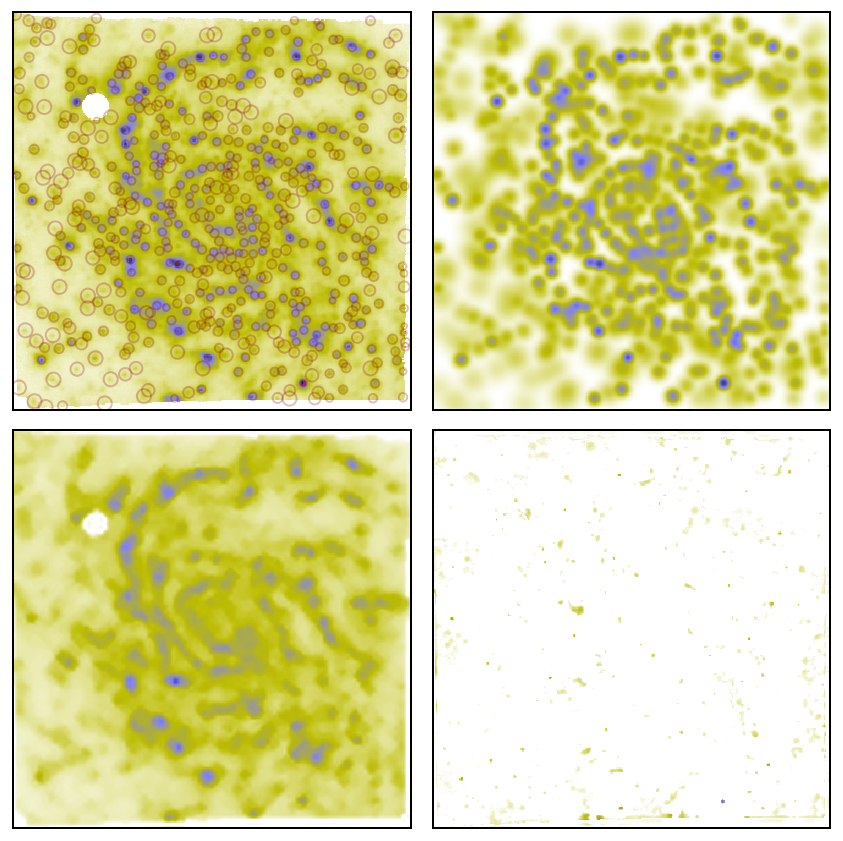

In [10]:
# SEXTRACTOR METHOD!
#
#
# Threshold
# 0.0031275233486667275
out = sew(DIR+"Ha_map.fits")
#print(out["table"])

fig, ax = plt.subplots(2,2,figsize=(15,15))

cmap = 'gist_stern_r'
im_Ha_MUSE=ax[0][0].imshow(F_Ha_MUSE, interpolation='none',\
                                     cmap=cmap, label=r'H$\alpha$',\
                                     norm=colors.PowerNorm(gamma=0.5))#,label=r'H$\alpha$') ç

#out["table"]["X_IMAGE"]
#print(x)
blobs_sew=np.array((out["table"]["Y_IMAGE"]-0.5,out["table"]["X_IMAGE"]-0.5,\
                    0.5*(out["table"]["PETRO_RADIUS"]+1.0)))
blobs_sew=np.swapaxes(blobs_sew,0,1)
blobs_sew_F_Ha,image_sew_HII,diff_sew_map_final,diff_sew_points,diff_sew_Flux=HIIextraction(F_Ha_MUSE,\
                                                                                            blobs_sew,\
                                                                            kind=0,we=2,\
                                                              FWHM_MUSE = FWHM_MUSE, refined = 0)
#blobs_sew = blobs_sew[blobs_sew_F_Ha/(3.1416*blobs_sew[:,2]**2)>threshold]

blobs_sew = blobs_sew[blobs_sew_F_Ha>1]
blobs_sew_F_Ha = blobs_sew_F_Ha[blobs_sew_F_Ha>1]
print(len(blobs_sew))

image_sew_HII=create_HII_image(blobs_sew,blobs_sew_F_Ha,ny,nx)

clim=im_Ha_MUSE.properties()['clim']
ax[0][1].imshow(image_sew_HII, interpolation='none',\
                     cmap=cmap, label=r'H$\alpha$',\
                     norm=colors.PowerNorm(gamma=0.5),clim=clim)#,label=r'H$\alpha$') ç

back_sew=DIR+"back.fits"
hdu=fits.open(back_sew)
back_sew=hdu[0].data


ax[1][0].imshow(back_sew, interpolation='none',\
                             cmap=cmap, \
                             norm=colors.PowerNorm(gamma=0.5),clim=clim)  #label=r'Hii regions',

res_sew=F_Ha_MUSE-(image_sew_HII+back_sew)
ax[1][1].imshow(res_sew,interpolation='none',\
                                     cmap=cmap,
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
#print(blobs_sew_F_Ha)

#flux_sew=extract_flux(blobs_sew,F_Ha_MUSE,kind=kind,we=we,dr=dr)

#print(blobs_final)
#print(blobs_sew)

#for blob in out["table"]:
#    x=blob["X_IMAGE"]-0.5
#    y=blob["Y_IMAGE"]-0.5
#    r=0.5*(blob["PETRO_RADIUS"]+1.0)


for blob in blobs_sew:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0][0].add_patch(c)


(ny,nx) = F_Ha_MUSE.shape
for ax_now in ax.reshape(-1):
    ax_now.set_xlim(0,nx)
    ax_now.set_ylim(0,ny)    
    
ax[0][0].axes.yaxis.set_ticklabels([])  
ax[0][1].axes.yaxis.set_ticklabels([])
ax[1][0].axes.yaxis.set_ticklabels([])
ax[1][1].axes.yaxis.set_ticklabels([])
            
ax[0][0].axes.xaxis.set_ticklabels([])    
ax[0][1].axes.xaxis.set_ticklabels([])   
ax[1][0].axes.xaxis.set_ticklabels([])
ax[1][1].axes.xaxis.set_ticklabels([])
        
ax[0][0].set_yticks([])
ax[0][1].set_yticks([])
ax[1][0].set_yticks([])
ax[1][1].set_yticks([])
        
ax[0][0].set_xticks([])
ax[0][1].set_xticks([])
ax[1][0].set_xticks([])
ax[1][1].set_xticks([])

plt.subplots_adjust(wspace=0.005, hspace=0.05)
plt.savefig(DIR+'SEW.pdf')
plt.show()


In [126]:
mask_F_Ha_neg = F_Ha_MUSE<0
F_Ha_MUSE_neg = F_Ha_MUSE [mask_F_Ha_neg]
F_Ha_MUSE_noise = np.concatenate((F_Ha_MUSE_neg,(-1)*F_Ha_MUSE_neg))
mean_F_Ha_MUSE_noise = np.nanmean(F_Ha_MUSE_noise)
std_F_Ha_MUSE_noise = np.nanstd(F_Ha_MUSE_noise)
MUSE_1sig = std_F_Ha_MUSE_noise
MUSE_3sig = 3*MUSE_1sig
F_Ha_MUSE_g=gaussian_filter(F_Ha_MUSE, sigma=2*FWHM_MUSE)
V_MUSE_g=gaussian_filter(V_MUSE, sigma=2*FWHM_MUSE)

mask_MUSE = (F_Ha_MUSE_g<2*MUSE_1sig) | (V_MUSE_g<0.5*MUSE_1sig_V) | (V_MUSE<MUSE_1sig_V)
X_sqr_sew = (res_sew**2)/MUSE_3sig**2 
X_sqr_masked_sew = np.ma.array(X_sqr_sew, mask = mask_MUSE, fill_value=0.0)
X_sqr_sum_sew = np.ma.sum(X_sqr_masked_sew)/X_sqr_masked_sew.count()

NameError: name 'MUSE_1sig' is not defined

In [11]:
def extracting_flux_elines(name, hdu, blobs_final, FWHM_MUSE, plot=0):
    
    try:
        data = hdu.data
        hdr_fe = hdu.header
        
    except:
        data=hdu[0].data
        hdr_fe=hdu[0].header
    
    keys = np.array(list(hdr_fe.keys()))
    val = np.array(list(hdr_fe.values()))

    nx = hdr_fe["NAXIS1"]
    ny = hdr_fe["NAXIS2"]
    nz = hdr_fe["NAXIS3"]

    model_HII = np.zeros((nz,ny,nx))
    model_diff = np.zeros((nz,ny,nx))

    CRVAL1 = hdr_fe["CRVAL1"]
    CRPIX1 = hdr_fe["CRPIX1"]
    CRVAL2 = hdr_fe["CRVAL2"]
    CRPIX2 = hdr_fe["CRPIX2"]
    
    try:
        CDELT1 = -(hdr_fe["CDELT1"])/3600
        CDELT2 = hdr_fe["CDELT2"]/3600

    except:
        CDELT1 = hdr_fe["CD1_1"]
        CDELT2 = hdr_fe["CD2_2"]
        
    WCS = np.array((CRPIX1,CRPIX2,CRVAL1,CRVAL2,CDELT1,CDELT2))

    dict_HII = {}
    list_HII = []

    for i in range(len(blobs_final)):
        list_HII.append(name+"-"+str(i+1))
    dict_HII["HIIREGID"] = list_HII
    dict_HII["X"] = blobs_final[:,1]
    dict_HII["Y"] = blobs_final[:,0]
    dict_HII["R"] = blobs_final[:,2]
    dict_HII["RA"] = (blobs_final[:,1]-CRPIX1+1)*CDELT1+CRVAL1
    dict_HII["DEC"] = (blobs_final[:,0]-CRPIX2+1)*CDELT2+CRVAL2
    dict_HII_units = {}
    dict_HII_units["HIIREGID"] = "number"
    dict_HII_units["X"] = "spaxels"
    dict_HII_units["Y"] = "spaxels"
    dict_HII_units["R"] = "spaxels"
    dict_HII_units["RA"] = "deg"
    dict_HII_units["DEC"] = "deg"

    plot = 0

    if (plot == 1):
        fig, axes = plt.subplots(1,3,figsize=(13,5))
        fig.canvas.set_window_title("HII explorer")

    for i in range(nz):
        key_now = "NAME"+str(i)
        key_wave_now = "WAVE"+str(i)
        val_now = hdr_fe[key_now].replace(" ", "_")
        try:
            wave_now =hdr_fe[key_wave_now].replace(" ", "_")
        except:
            wave_now =""

        val_now = val_now+wave_now.split(".")[0]
        print(i, " ", nz, " val_now=", val_now)
        dict_HII_units[val_now] = ""
        error = 0
        kind = 1
        refined = 0
        
        if ("e_" in val_now):
            error = 1
            refined = 0
        if ("flux" in val_now):
            kind = 0
            refined = 3
            dict_HII_units[val_now] = "10^-16 erg/s/cm^2"
        if ("EW" in val_now):
            dict_HII_units[val_now] = "Angstrom"
        if ("vel" in val_now):
            dict_HII_units[val_now] = "km/s"
        if ("disp" in val_now):
            dict_HII_units[val_now] = "km/s"
        dict_HII_units[val_now] = dict_HII_units[val_now]
        map_now = data[i,:,:]
#        if ((def_DIG==1)&("flux" in val_now)&(error==0)):
#            map_now = data[i,:,:] - cube_DIG[i,:,:]
#            if ("flux" in val_now):
#                kind = 0
#                refined = 0
#        if (error == 1):
#            map_now = map_now**2
            
        flux_HII,img_HII,img_diff,diff_points,diff_val = HIIextraction(map_now,blobs_final,kind=kind, we=2, refined=refined)
        
#        img_diff,diff_points,diff_Flux = create_diff(img_diff,blobs_final,FWHM_MUSE)
        
        if (error == 1):
            map_now = np.sqrt(map_now)
            flux_HII = np.sqrt(flux_HII)
#            diff_Flux = np.sqrt(diff_Flux)
            img_HII = np.sqrt(img_HII)
#           img_diff = np.sqrt(img_diff)

        dict_HII[val_now] = flux_HII    

        model_HII[i,:,:] = img_HII

    
        if (plot == 1):
            for ax in axes:
                ax.cla()
            (nx,ny) = map_now.shape
            cmap='gist_stern_r'
            im_Ha=axes[0].imshow(map_now, interpolation='none', cmap=cmap, norm=colors.PowerNorm(gamma=0.5)) 
            clim=im_Ha.properties()['clim']
            axes[1].imshow(img_HII, interpolation='none',cmap=cmap, label=r'H$\alpha$',norm=colors.PowerNorm(gamma=0.5), clim=clim) 
            axes[2].imshow(img_diff, interpolation='none',cmap=cmap, label=r'H$\alpha$',norm=colors.PowerNorm(gamma=0.5), clim=clim) 
            axes[0].set_xlim(0,nx)
            axes[0].set_ylim(0,ny)
            axes[1].set_xlim(0,nx)
            axes[1].set_ylim(0,ny)    
            axes[2].set_xlim(0,nx)
            axes[2].set_ylim(0,ny)  
            axes[0].set_title(val_now)
            fig.canvas.draw()

    hdu_HII = fits.PrimaryHDU(data = model_HII , header = hdr_fe)

    table_HII = Table(dict_HII)
    for key in dict_HII.keys():
        table_HII[key].unit=dict_HII_units[key]

    return WCS, hdu_HII, table_HII


In [12]:
WCS, hdu_HII_se, table_HII_se = extracting_flux_elines('NGC4030_se', hdu_fe, blobs_sew, 
                                                                     FWHM_MUSE=1.0,  plot=1)


0   1048  val_now= flux_[FeIII]4754
1   1048  val_now= flux_[FeIII]4769
2   1048  val_now= flux_[FeII]4774
3   1048  val_now= flux_[FeIII]4777
4   1048  val_now= flux_[FeIII]4813
5   1048  val_now= flux_[FeII]4814
6   1048  val_now= flux_Hbeta4861
7   1048  val_now= flux_[FeIII]4881
8   1048  val_now= flux_[FeII]4889
9   1048  val_now= flux_[FeVII]4893
10   1048  val_now= flux_[FeII]4905
11   1048  val_now= flux_HeI4921
12   1048  val_now= flux_[FeIII]4924
13   1048  val_now= flux_[FeIII]4930
14   1048  val_now= flux_[FeVII]4942
15   1048  val_now= flux_[OIII]4958
16   1048  val_now= flux_[FeVI]4972
17   1048  val_now= flux_[FeII]4973
18   1048  val_now= flux_[FeIII]4985
19   1048  val_now= flux_[OIII]5006
20   1048  val_now= flux_HeI5015
21   1048  val_now= flux_[FeII]5039
22   1048  val_now= flux_[FeII]5072
23   1048  val_now= flux_[FeII]5107
24   1048  val_now= flux_[FeII]5111
25   1048  val_now= flux_[FeVI]5145
26   1048  val_now= flux_[FeII]5158
27   1048  val_now= flux_[FeVII]515

232   1048  val_now= vel_HI8345
233   1048  val_now= vel_[CrII]8357
234   1048  val_now= vel_HI8359
235   1048  val_now= vel_HI8374
236   1048  val_now= vel_HI8392
237   1048  val_now= vel_OI8446
238   1048  val_now= vel_HI8467
239   1048  val_now= vel_CaII8498
240   1048  val_now= vel_HI8502
241   1048  val_now= vel_CaII8542
242   1048  val_now= vel_HI8545
243   1048  val_now= vel_[ClII]8578
244   1048  val_now= vel_HI8598
245   1048  val_now= vel_[FeII]8616
246   1048  val_now= vel_CaII8662
247   1048  val_now= vel_HI8665
248   1048  val_now= vel_[CI]8727
249   1048  val_now= vel_HI8750
250   1048  val_now= vel_HI8862
251   1048  val_now= vel_[FeII]8891
252   1048  val_now= vel_HI9014
253   1048  val_now= vel_[FeII]9033
254   1048  val_now= vel_[FeII]9051
255   1048  val_now= vel_[SIII]9069
256   1048  val_now= vel_[ClII]9123
257   1048  val_now= vel_[FeII]9226
258   1048  val_now= vel_HI9229
259   1048  val_now= vel_OI9266
260   1048  val_now= vel_[FeII]9267
261   1048  val_now= vel

464   1048  val_now= EW_[SII]6730
465   1048  val_now= EW_FeI6855
466   1048  val_now= EW_[ArV]7005
467   1048  val_now= EW_HeI7065
468   1048  val_now= EW_[ArIII]7135
469   1048  val_now= EW_[FeII]7155
470   1048  val_now= EW_[FeII]7171
471   1048  val_now= EW_CII7236
472   1048  val_now= EW_HeI7281
473   1048  val_now= EW_[FeI]7290
474   1048  val_now= EW_[CaII]7291
475   1048  val_now= EW_[OII]7318
476   1048  val_now= EW_[CaII]7323
477   1048  val_now= EW_[OII]7329
478   1048  val_now= EW_[NiII]7377
479   1048  val_now= EW_[FeII]7388
480   1048  val_now= EW_[NiII]7411
481   1048  val_now= EW_[FeII]7452
482   1048  val_now= EW_[FeII]7637
483   1048  val_now= EW_[FeII]7686
484   1048  val_now= EW_[FeII]7686
485   1048  val_now= EW_[ArIII]7751
486   1048  val_now= EW_OI7774
487   1048  val_now= EW_[FeXI]7891
488   1048  val_now= EW_[CrII]7999
489   1048  val_now= EW_[CrII]8125
490   1048  val_now= EW_[CrII]8229
491   1048  val_now= EW_HeII8236
492   1048  val_now= EW_[NiII]8300
493   

686   1048  val_now= e_vel_[NI]5197
687   1048  val_now= e_vel_[NI]5200
688   1048  val_now= e_vel_[FeII]5220
689   1048  val_now= e_vel_[FeII]5261
690   1048  val_now= e_vel_[FeII]5268
691   1048  val_now= e_vel_[FeIII]5270
692   1048  val_now= e_vel_[FeII]5273
693   1048  val_now= e_vel_[FeVI]5277
694   1048  val_now= e_vel_[FeII]5296
695   1048  val_now= e_vel_[FeXIV]5302
696   1048  val_now= e_vel_[CaV]5309
697   1048  val_now= e_vel_[FeII]5333
698   1048  val_now= e_vel_[FeVI]5335
699   1048  val_now= e_vel_[FeII]5376
700   1048  val_now= e_vel_HeII5411
701   1048  val_now= e_vel_[FeII]5412
702   1048  val_now= e_vel_[FeVI]5424
703   1048  val_now= e_vel_[FeVI]5426
704   1048  val_now= e_vel_[FeVI]5484
705   1048  val_now= e_vel_[ClIII]5517
706   1048  val_now= e_vel_[FeII]5527
707   1048  val_now= e_vel_[OI]5577
708   1048  val_now= e_vel_[FeVI]5631
709   1048  val_now= e_vel_[FeVI]5677
710   1048  val_now= e_vel_[FeVII]5720
711   1048  val_now= e_vel_[NII]5754
712   1048  val_no

904   1048  val_now= e_disp_HI8750
905   1048  val_now= e_disp_HI8862
906   1048  val_now= e_disp_[FeII]8891
907   1048  val_now= e_disp_HI9014
908   1048  val_now= e_disp_[FeII]9033
909   1048  val_now= e_disp_[FeII]9051
910   1048  val_now= e_disp_[SIII]9069
911   1048  val_now= e_disp_[ClII]9123
912   1048  val_now= e_disp_[FeII]9226
913   1048  val_now= e_disp_HI9229
914   1048  val_now= e_disp_OI9266
915   1048  val_now= e_disp_[FeII]9267
916   1048  val_now= e_disp_[FeII]9399
917   1048  val_now= e_EW_[FeIII]4754
918   1048  val_now= e_EW_[FeIII]4769
919   1048  val_now= e_EW_[FeII]4774
920   1048  val_now= e_EW_[FeIII]4777
921   1048  val_now= e_EW_[FeIII]4813
922   1048  val_now= e_EW_[FeII]4814
923   1048  val_now= e_EW_Hbeta4861
924   1048  val_now= e_EW_[FeIII]4881
925   1048  val_now= e_EW_[FeII]4889
926   1048  val_now= e_EW_[FeVII]4893
927   1048  val_now= e_EW_[FeII]4905
928   1048  val_now= e_EW_HeI4921
929   1048  val_now= e_EW_[FeIII]4924
930   1048  val_now= e_EW_[Fe

In [13]:
Ha_v2=table_HII_pyhiiv2['flux_Halpha6562']
Hb_v2=table_HII_pyhiiv2['flux_Hbeta4861']
OIII_v2=table_HII_pyhiiv2['flux_[OIII]4958']
NII_v2=table_HII_pyhiiv2['flux_[NII]6583']
SII_1_v2=table_HII_pyhiiv2['flux_[SII]6716']
SII_2_v2=table_HII_pyhiiv2['flux_[SII]6730']
SII_v2=SII_1_v2+SII_2_v2
OI_v2=table_HII_pyhiiv2['flux_[OI]6300']
EWHa_v2 = table_HII_pyhiiv2['EW_Halpha6562']

O3_v2=np.log10(OIII_v2)-np.log10(Hb_v2)
N2_v2=np.log10(NII_v2)-np.log10(Ha_v2)
S2_v2=np.log10(SII_v2/Ha_v2)
O1_v2=np.log10(OI_v2/Ha_v2)

log_EWHa_v2=np.log10(np.abs(EWHa_v2))
#mask_Ha_v2 = Ha_v2>-100

###########################################

#Ha_DIG_v2=table_DIG_pyhiiv2['flux_Halpha6562']
#Hb_DIG_v2=table_DIG_pyhiiv2['flux_Hbeta4861']
#OIII_DIG_v2=table_DIG_pyhiiv2['flux_[OIII]4958']
#NII_DIG_v2=table_DIG_pyhiiv2['flux_[NII]6583']
#SII_1_DIG_v2=table_DIG_pyhiiv2['flux_[SII]6716']
#SII_2_DIG_v2=table_DIG_pyhiiv2['flux_[SII]6730']
#SII_DIG_v2=SII_1_DIG_v2+SII_2_DIG_v2
#OI_DIG_v2=table_DIG_pyhiiv2['flux_[OI]6300']
#EWHa_DIG_v2 = table_DIG_pyhiiv2['EW_Halpha6562']

#O3_DIG_v2=np.log10(OIII_DIG_v2)-np.log10(Hb_DIG_v2)
#N2_DIG_v2=np.log10(NII_DIG_v2)-np.log10(Ha_DIG_v2)
#S2_DIG_v2=np.log10(SII_DIG_v2/Ha_DIG_v2)
#O1_DIG_v2=np.log10(OI_DIG_v2/Ha_DIG_v2)

#log_EWHa_DIG_v2=np.log10(np.abs(EWHa_DIG_v2))


data_DIG_V2 = hdu_DIG_pyhiiv2.data

Ha_DIG_v2=data_DIG_V2[67,:,:]
Hb_DIG_v2=data_DIG_V2[6,:,:]
OIII_DIG_v2=data_DIG_V2[15,:,:]
NII_DIG_v2=data_DIG_V2[68,:,:]
SII_1_DIG_v2=data_DIG_V2[70,:,:]
SII_2_DIG_v2=data_DIG_V2[71,:,:]
SII_DIG_v2=SII_1_DIG_v2+SII_2_DIG_v2
OI_DIG_v2=data_DIG_V2[61,:,:]
EWHa_DIG_v2 = data_DIG_V2[460,:,:]

O3_DIG_v2=np.log10(OIII_DIG_v2)-np.log10(Hb_DIG_v2)
N2_DIG_v2=np.log10(NII_DIG_v2)-np.log10(Ha_DIG_v2)
S2_DIG_v2=np.log10(SII_DIG_v2/Ha_DIG_v2)
O1_DIG_v2=np.log10(OI_DIG_v2/Ha_DIG_v2)

log_EWHa_DIG_v2=np.log10(np.abs(EWHa_DIG_v2))


<Figure size 432x288 with 0 Axes>

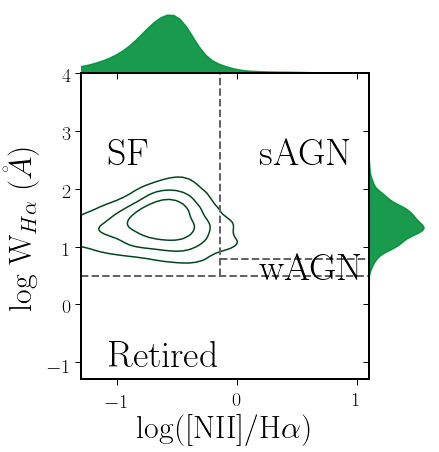

In [112]:
whan_pyhiiextractor=create_whan(N2_v2, log_EWHa_v2, 'Greens_r', '#008F39',  -1.3, 1.1, -1.3, 4,
                                 'whan_pyhiiexplorerv2', DIR= '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/')


plt.show()

<Figure size 432x288 with 0 Axes>

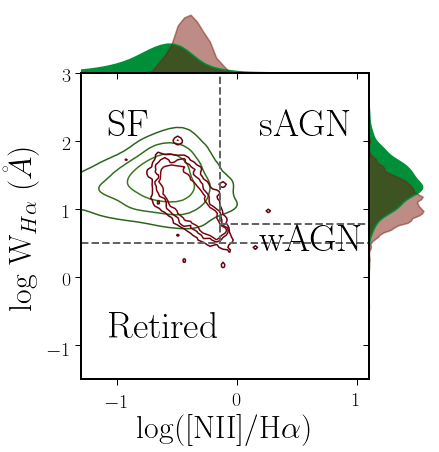

In [15]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(log_EWHa_v2.flat)

x_plt2 = np.array(N2_DIG_v2.flat)
y_plt2 = np.array(log_EWHa_DIG_v2.flat)

x_min=-1.3
x_max=1.1
y_min=-1.5
y_max=3
        
fig = plt.figure()
    
maska2 = (x_plt2>=-500000)&(x_plt2<=500000)&(y_plt2>=-500000)&(y_plt2<=500000)
maska1 = (x_plt>=-500000)&(x_plt<=500000)&(y_plt>=-500000)&(y_plt<=500000)
x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]
df = pd.DataFrame({"x":x_plt,"y":y_plt})  
    
ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0, vmax=20, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                 shade_lowest=False, alpha=1, marginal_kws={"color": '#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])
    
ax.x = x_plt2
ax.y = y_plt2
ax.plot_joint(sns.kdeplot, cmap='Reds_r', vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])
ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)', r'log W$_{H\alpha}$ ($\AA$)', size=32)
ax.plot_marginals(sns.kdeplot, color='#7a1b0c', shade=True, alpha=0.5)

ax.ax_joint.plot((-0.14,-0.14), (0.5,y_max) ,c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((-0.14,x_max), (0.79,0.79), c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((x_min,x_max), (0.5,0.5), c='#646464', ls="--", linewidth=2)

plt.text(0.25, 1.1, 'SF', fontsize=38, fontweight=800,transform=fig.transFigure)
plt.text(0.6, 1.1, 'sAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.6, 0.7, 'wAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.25, 0.4, 'Retired', fontsize=38, fontweight=800, transform=fig.transFigure)

plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)

plt.savefig('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/'+"whan_pyhiiexplorerv2.pdf")
plt.savefig('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/'+"whan_pyhiiexplorerv2.png")

plt.show()


<Figure size 432x288 with 0 Axes>

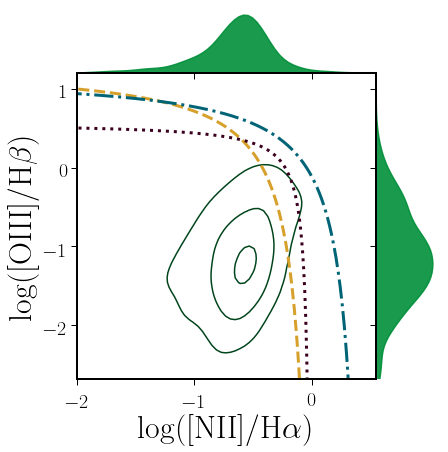

In [113]:

bpt_pyhiiextractor=create_bpt_sns_single (x_plt=N2_v2, y_plt=O3_v2, cmap='Greens_r', c='#008F39', 
                                   x_min1=-4,x_max1=0.45, y_min1=-2.7, y_max1=1.2, 
                                   legend='pyHIIExplorerV2', namesave='bpt_pyhiiv2', 
                                   DIR= '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/')


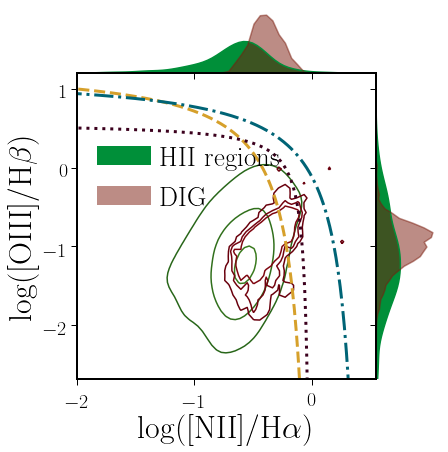

In [17]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(O3_v2.flat)

x_plt2 = np.array(N2_DIG_v2.flat)
y_plt2 = np.array(O3_DIG_v2.flat)

x_min1=-4
x_max1=0.45
y_min1=-2.7
y_max1=1.2

x=np.linspace(x_min1,x_max1,500)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y5_ce=0.13/(x-0.003)+0.57
cut_y_SII=0.72/(x-0.32)+1.3;
cut_y_SII_ce=0.04/(x+0.012)+0.58
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OI_ce=0.056/(x+0.40)+0.61
cut_y_OIII_AGNs=1.14*(x)+0.36;


maska2 = (x_plt2>=-500000)&(x_plt2<=500000)& (y_plt2>=-500000)&(y_plt2<=500000)
maska1 = (x_plt>=-500000)&(x_plt<=500000)& (y_plt>=-500000)&(y_plt<=500000)

x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]

df = pd.DataFrame({"x":x_plt,"y":y_plt})


ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0,vmax=20, xlim=[x_min1+2,x_max1+0.1], ylim=[y_min1,y_max1],shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color":'#008f39',  "alpha": 1}, levels=[0.15, 0.5, 0.99])

ax.x = x_plt2
ax.y = y_plt2

ax.plot_joint(sns.kdeplot, cmap='Reds_r', vmin=0,vmax=20, shade=False,  shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])

ax.ax_joint.plot(x[x<-0.01], cut_y3[x<-0.01], '#D6A02B', linestyle='--', linewidth=3)
ax.ax_joint.plot(x,cut_y4, c='#006476', linestyle='-.',linewidth=3)
ax.ax_joint.plot(x[x<-0.01],cut_y5_ce[x<-0.01],c="#3b001d", linestyle=':',linewidth=3)


ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)',r'log([OIII]/H$\beta$)', size=32)
ax.plot_marginals(sns.kdeplot, color= '#7a1b0c',shade=True, alpha=0.5)

plt.subplots_adjust(left=0.17, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
plt.legend(['HII regions', 'DIG'],  loc='3', bbox_to_anchor=(-1.2, 0.85), prop={'size': 27})

plt.savefig('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/'+"bpt_pyhiiv2.pdf")
plt.savefig('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/'+"bpt_pyhiiv2.png")

plt.show()

In [18]:
bpt_pyhiiv2= mpimg.imread('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/bpt_pyhiiv2.png')
whan_pyhiiexplorerv2= mpimg.imread('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/whan_pyhiiexplorerv2.png')

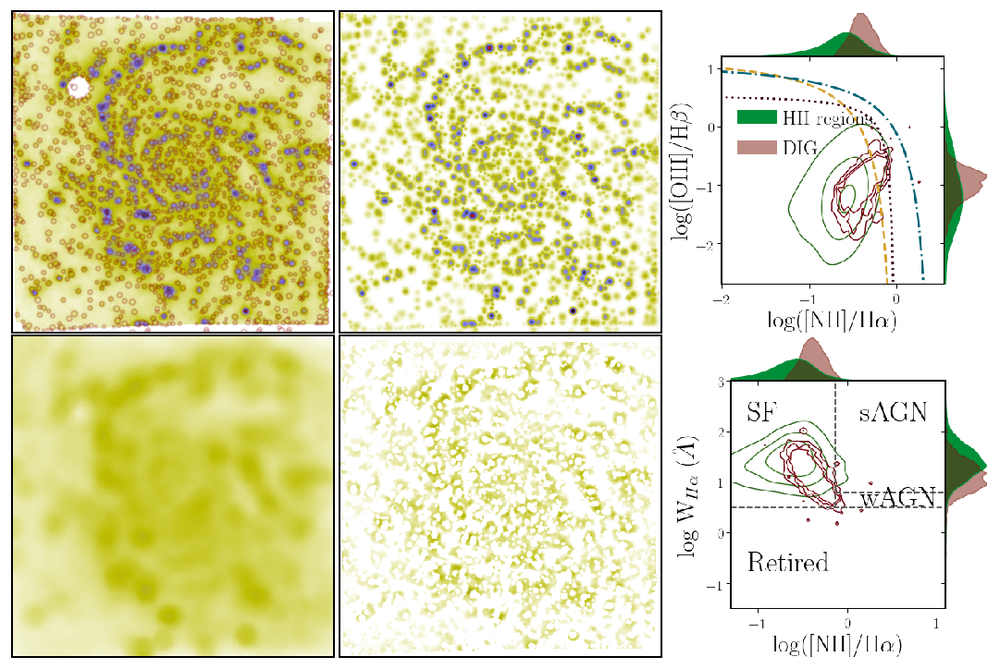

In [19]:
res_map = F_Ha_MUSE-(image_HII+diff_map_final)

fig, ax = plt.subplots(2,3,figsize=(15,10))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0][0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_final:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0][0].add_patch(c)
        
ax[0][1].imshow(image_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[0][2].imshow(bpt_pyhiiv2, interpolation='none')
        
ax[1][0].imshow(diff_map_final, interpolation='none', cmap=cmap, label=r'Diffuse',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[1][1].imshow(res_map, interpolation='none', cmap=cmap, label=r'Diffuse',
                      norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[1][2].imshow(whan_pyhiiexplorerv2, interpolation='none')

ax[0][2].axis('off')
ax[1][2].axis('off')

ax[0][0].set_xlim(0,nx)
ax[0][0].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[1][0].set_xlim(0,nx)
ax[1][0].set_ylim(0,ny)

ax[1][1].set_xlim(0,nx)
ax[1][1].set_ylim(0,ny)

        
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.01)
plt.savefig('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer'+'/'+'NGC4030'+'_pv2.pdf')
plt.savefig('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer'+'/'+'NGC4030'+'_pv2.png')

plt.show()


In [20]:
#
#fig, axes = plt.subplots(1,3,figsize=(12,5), sharey=True, squeeze=False)
#x_min1=-1.79
#x_max1=0.39
#y_min1=-2.49
#y_max1=1.19


#x=np.linspace(2*x_min1,2*x_max1,100)
#cut_y=-0.7+0.2-3.67*x
#cut_y2=-1.7+0.5-3.67*x
#cut_y3=0.61/(x-0.05)+1.3
#cut_y4=0.61/(x-0.47)+1.19
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII_AGNs=1.89*(x)+0.76;
#cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
#cut_y_OI_AGNs=1.18*(x)+1.30;
#cut_y_OIII_AGNs=1.14*(x)+0.36;
#l_EW_min=-0.5
#l_EW_max=2.5
#cm = plt.cm.get_cmap('jet_r')

#cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)

#axes[0,0].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,0].plot(x,cut_y4,'b-')
#axes[0,1].plot(x[x<0.1],cut_y_SII[x<0.1],'b-')
#axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'b-')

#plt.rcParams.update({'font.size': 16})
#axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
#axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
#axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
#axes[0,2].set_xlabel(r'log([Oi]/H$\alpha$)')
#axes[0,0].set_xlim(x_min1,x_max1)
#axes[0,1].set_xlim(x_min1+0.4,x_max1)
#axes[0,2].set_xlim(x_min1-1.1,x_max1-0.2)
#axes[0,0].set_ylim(y_min1,y_max1)

#cb=add_colorbar(cax3)
#cb.set_label(r'$log|EW(H\alpha)|$')
#plt.subplots_adjust(wspace=0)
#plt.show()


In [21]:
Ha_se=table_HII_se['flux_Halpha6562']
Hb_se=table_HII_se['flux_Hbeta4861']
OIII_se=table_HII_se['flux_[OIII]4958']
NII_se=table_HII_se['flux_[NII]6583']
SII_1_se=table_HII_se['flux_[SII]6716']
SII_2_se=table_HII_se['flux_[SII]6730']
SII_se=SII_1_se+SII_2_se
OI_se=table_HII_se['flux_[OI]6300']
EWHa_se = table_HII_se['EW_Halpha6562']

O3_se=np.log10(OIII_se)-np.log10(Hb_se)
N2_se=np.log10(NII_se)-np.log10(Ha_se)

S2_se=np.log10(SII_se/Ha_se)
O1_se=np.log10(OI_se/Ha_se)

log_EWHa_se=np.log10(np.abs(EWHa_se))
#mask_Ha = Ha_se>-1000


In [22]:
#bpt_se=create_bpt_sns_single (x_plt=N2_se, y_plt=O3_se, cmap='Greens_r', c='#008F39', 
#                                   x_min1=-1.5,x_max1=0.4, y_min1=-2.3, y_max1=1.3, 
#                                   legend='SE', namesave='bpt_se', 
#                                   DIR= '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_sextractor/')



In [23]:
DIR= '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_sextractor/'


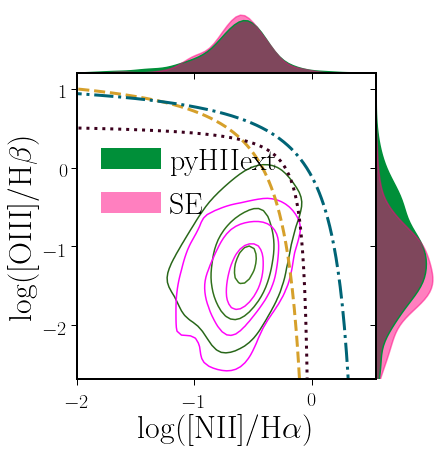

In [24]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(O3_v2.flat)

x_plt2 = np.array(N2_se.flat)
y_plt2 = np.array(O3_se.flat)

x_min1=-4
x_max1=0.45
y_min1=-2.7
y_max1=1.2

x=np.linspace(x_min1,x_max1,500)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y5_ce=0.13/(x-0.003)+0.57
cut_y_SII=0.72/(x-0.32)+1.3;
cut_y_SII_ce=0.04/(x+0.012)+0.58
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OI_ce=0.056/(x+0.40)+0.61
cut_y_OIII_AGNs=1.14*(x)+0.36;


maska2 = (x_plt2>=-500)&(x_plt2<=500)& (y_plt2>=-500)&(y_plt2<=500)
maska1 = (x_plt>=-500)&(x_plt<=500)& (y_plt>=-500)&(y_plt<=500)

x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]

df = pd.DataFrame({"x":x_plt,"y":y_plt})


ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0,vmax=20, xlim=[x_min1+2,x_max1+0.1], ylim=[y_min1,y_max1],shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color":'#008f39',  "alpha": 1}, levels=[0.15, 0.5, 0.99])

ax.x = x_plt2
ax.y = y_plt2

ax.plot_joint(sns.kdeplot, cmap='spring', vmin=0,vmax=20, shade=False,  shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])

ax.ax_joint.plot(x[x<-0.01], cut_y3[x<-0.01], '#D6A02B', linestyle='--', linewidth=3)
ax.ax_joint.plot(x,cut_y4, c='#006476', linestyle='-.',linewidth=3)
ax.ax_joint.plot(x[x<-0.01],cut_y5_ce[x<-0.01],c="#3b001d", linestyle=':',linewidth=3)


ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)',r'log([OIII]/H$\beta$)', size=32)
ax.plot_marginals(sns.kdeplot, color= '#FF0080',shade=True, alpha=0.5)

plt.subplots_adjust(left=0.17, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
plt.legend(['pyHIIext', 'SE'],  loc='3', bbox_to_anchor=(-1.2, 0.85), prop={'size': 30})
plt.savefig(DIR+"bpt_se.pdf")
plt.savefig(DIR+"bpt_se.png")

plt.show()

<Figure size 432x288 with 0 Axes>

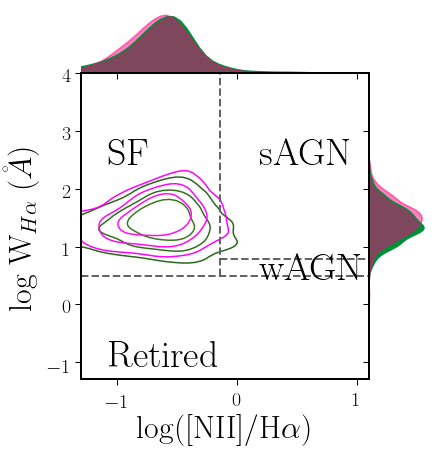

In [25]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(log_EWHa_v2.flat)

x_plt2 = np.array(N2_se.flat)
y_plt2 = np.array(log_EWHa_se.flat)

x_min=-1.3
x_max=1.1
y_min=-1.3
y_max=4
        
fig = plt.figure()
    
maska2 = (x_plt2>=-5000)&(x_plt2<=5000)&(y_plt2>=-5000)&(y_plt2<=5000)
maska1 = (x_plt>=-5000)&(x_plt<=5000)&(y_plt>=-5000)&(y_plt<=5000)
x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]
df = pd.DataFrame({"x":x_plt,"y":y_plt})  
    
ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0, vmax=20, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                 shade_lowest=False, alpha=1, marginal_kws={"color": '#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])
    
ax.x = x_plt2
ax.y = y_plt2
ax.plot_joint(sns.kdeplot, cmap='spring', vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])
ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)', r'log W$_{H\alpha}$ ($\AA$)', size=32)
ax.plot_marginals(sns.kdeplot, color='#FF0080', shade=True, alpha=0.5)

ax.ax_joint.plot((-0.14,-0.14), (0.5,y_max) ,c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((-0.14,x_max), (0.79,0.79), c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((x_min,x_max), (0.5,0.5), c='#646464', ls="--", linewidth=2)

plt.text(0.25, 1.0, 'SF', fontsize=38, fontweight=800,transform=fig.transFigure)
plt.text(0.6, 1.0, 'sAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.6, 0.6, 'wAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.25, 0.3, 'Retired', fontsize=38, fontweight=800, transform=fig.transFigure)

plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)

plt.savefig(DIR+"whan_se.pdf")
plt.savefig(DIR+"whan_se.png")

plt.show()


In [26]:
bpt_se= mpimg.imread('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_sextractor/bpt_se.png')
whan_se= mpimg.imread('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_sextractor/whan_se.png')

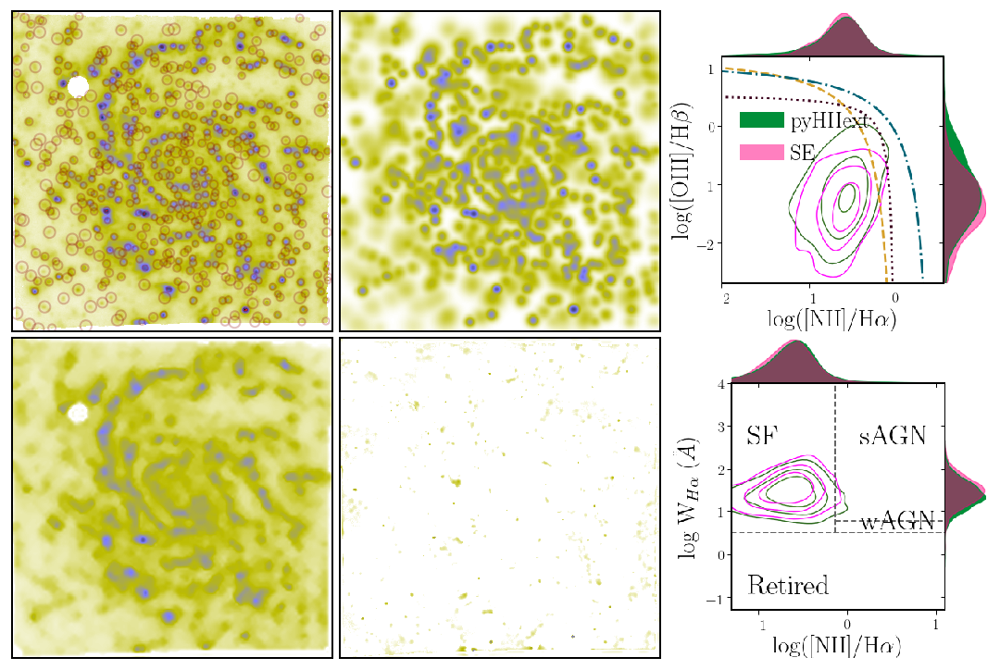

In [27]:
res_map = F_Ha_MUSE-(image_HII+diff_map_final)

fig, ax = plt.subplots(2,3,figsize=(15,10))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0][0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_sew:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0][0].add_patch(c)
        
ax[0][1].imshow(image_sew_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[0][2].imshow(bpt_se, interpolation='none')
        
ax[1][0].imshow(back_sew, interpolation='none', cmap=cmap, label=r'Diffuse',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[1][1].imshow(res_sew, interpolation='none', cmap=cmap, label=r'Diffuse',
                      norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[1][2].imshow(whan_se, interpolation='none')

ax[0][2].axis('off')
ax[1][2].axis('off')

ax[0][0].set_xlim(0,nx)
ax[0][0].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[1][0].set_xlim(0,nx)
ax[1][0].set_ylim(0,ny)

ax[1][1].set_xlim(0,nx)
ax[1][1].set_ylim(0,ny)

        
    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(DIR+'NGC4030'+'_se.pdf')
plt.savefig(DIR+'NGC4030'+'_se.png')

plt.show()


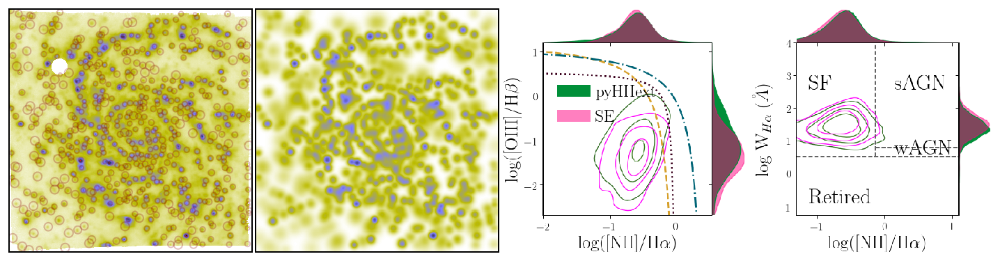

In [28]:
fig, ax = plt.subplots(1,4,figsize=(20,5))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_sew:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0].add_patch(c)
        
ax[1].imshow(image_sew_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[2].imshow(bpt_se, interpolation='none')
        
ax[3].imshow(whan_se, interpolation='none')

ax[2].axis('off')
ax[3].axis('off')

ax[0].set_xlim(0,nx)
ax[0].set_ylim(0,ny)

ax[1].set_xlim(0,nx)
ax[1].set_ylim(0,ny)

        
    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(DIR+'NGC4030'+'_SE.pdf')
plt.savefig(DIR+'NGC4030'+'_SE.png')

plt.show()


In [29]:
#whan_se=create_whan(N2, log_EWHa, 'winter', 'b',  -1.2, 1, -1.3, 4,
#                                 'whan_pyhiiexplorerv2', DIR= '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_sextractor/')


#plt.show()

In [30]:

#
#
#fig, axes = plt.subplots(1,3,figsize=(12,5), sharey=True, squeeze=False)
#x_min1=-1.79
#x_max1=0.39
#y_min1=-2.49
#y_max1=1.19


#x=np.linspace(2*x_min1,2*x_max1,100)
#cut_y=-0.7+0.2-3.67*x
#cut_y2=-1.7+0.5-3.67*x
#cut_y3=0.61/(x-0.05)+1.3
#cut_y4=0.61/(x-0.47)+1.19
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII_AGNs=1.89*(x)+0.76;
#cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
#cut_y_OI_AGNs=1.18*(x)+1.30;
#cut_y_OIII_AGNs=1.14*(x)+0.36;
#l_EW_min=-0.5
#l_EW_max=2.5
#cm = plt.cm.get_cmap('jet_r')

#cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)

#axes[0,0].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,0].plot(x,cut_y4,'b-')
#axes[0,1].plot(x[x<0.1],cut_y_SII[x<0.1],'b-')
#axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'b-')


#plt.rcParams.update({'font.size': 16})
#axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
#axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
#axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
#axes[0,2].set_xlabel(r'log([Oi]/H$\alpha$)')
#axes[0,0].set_xlim(x_min1,x_max1)
#axes[0,1].set_xlim(x_min1+0.4,x_max1)
#axes[0,2].set_xlim(x_min1-1.1,x_max1-0.2)
#axes[0,0].set_ylim(y_min1,y_max1)

#cb=add_colorbar(cax3)
#cb.set_label(r'$log|EW(H\alpha)|$')

#print(N2)
#plt.subplots_adjust(wspace=0)
#plt.show()

In [31]:
#CARLOS METHOD py HIIexplorer

from pyHIIV1 import *
from pyHIIV1.CALIFA_utils import *
from pyHIIV1.pyHIIexplorer import *
import scipy.constants as scts

In [32]:
DIR = '/home/alugo/Documentos/comp_hiiblob/MUSEW/datos_muse'
max_dist = 10
frac_peak=0.1
F_min=300
dist=40.5
min_flux=1
XC=160
YC=160
verbose=False
PSF = 0.2
name1 = name
obj_name = name1
output_path='/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIV1/'
#fe_dir = 'MUSE/'
#sfh_dir = 'MUSE/'
#ssp_dir = 'MUSE/'
#fe_file = DIR+ '/flux_elines.{}.cube.fits.gz'.format(obj_name)
fe_file = DIR+ '/flux_elines_long.{}.cube.fits.gz'.format(obj_name)

sfh_file = DIR + '{}.SFH.cube.fits.gz'.format(obj_name)
ssp_file = DIR + '{}.SSP.cube.fits.gz'.format(obj_name)

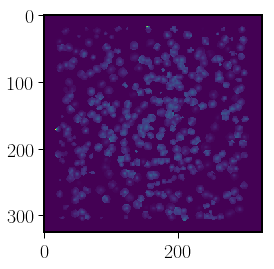

In [33]:
#pyHIIexplorer(fe_file, output_path, max_dist, frac_peak, F_min, dist,
#                      min_flux, XC, YC, verbose=verbose, n_index=20).HIIrecover()

seg_map = output_path + "seg_Ha.{}.fits.gz".format(obj_name)
#extract_HIIregions(obj_name)
back_pv1_file="/home/alugo/Documentos/comp_hiiblob/MUSEW/CLEAN.seg_Ha.NGC4030.fits.gz"
hdu=fits.open(back_pv1_file)
back_pv1=hdu[0].data
pv1_img=plt.imshow(back_pv1*F_Ha_MUSE)
#plt.imshow(F_Ha_MUSE)
plt.show()

In [34]:
def extract_flux_elines_table(seg_map, fe_file, output, verbose,
                              obj_name_from_header=False):
    spol = scts.speed_of_light/1000
    header, data = read_flux_elines_cubes(fe_file,
                                          header=True, verbose=verbose)
    (nz_dt, ny_dt, nx_dt) = data.shape
    if obj_name_from_header:
        name_fe = header['OBJECT']
    else:
        name_file = fe_file.split('/')[-1]
        names = name_file.split('.')
        name_fe = names[1]

#        name_fe = fe_file.split('/')[-1][12:-13] 
    hdr, data_seg_map = read_seg_map(seg_map, header=True, verbose=verbose)
    ns = int(np.max(data_seg_map))
    #print('NS =',ns)
    if verbose:
        print('Clumpy regions found: {}'.format(ns))
    if ns > 0:
        name_seg = hdr['OBJECT']
        if name_fe != name_seg:
            print('OBJECT in header files does not match')
        obj_name = name_fe
        print('Starting extract fe table for galaxy {}'.format(obj_name))
        crval1 = header['CRVAL1']
        try:
            cdelta2 = header['CDELT2']/3600.0
            cdelta1 = header['CDELT1']/3600.0
        except:
            cdelta2 = header['CD2_2']
            cdelta1 = header['CD1_1']
        crpix1 = header['CRPIX1']
        crval2 = header['CRVAL2']
        crpix2 = header['CRPIX2']
        # name = header['OBJECT']
        name = name_fe
        try:
            califaID = header['CALIFAID']
        except:
            califaID = header['OBJECT']
        
        wavelengths = np.loadtxt('emission_lines.LIST',
                                 comments='#', usecols=[0])
        name_elines = np.loadtxt('emission_lines.LIST', comments='#',
                                 usecols=[1], dtype=np.str)
        nz_Ha = np.where(name_elines == 'Halpha')[0].item()
        
        NZ = wavelengths.size
        
        if verbose:
            print('Index of Halpha = {}'.format(nz_Ha))
        NZ_CUBE = nz_dt/8
        if NZ_CUBE != NZ:
            print("Wrong emission line table! ({} != {})".format(NZ, NZ_CUBE))
            return None
        (ny_seg, nx_seg) = data_seg_map.shape
        if nx_dt > nx_seg or ny_dt > ny_seg:
            print("Dimension doesn't match ({}x{})!=({}x{})".format(nx_dt,
                                                                    ny_dt,
                                                                    nx_seg,
                                                                    ny_seg))
            return None

        regions_id = np.arange(0,ns+1,1)
#        regions_id = np.unique(data_seg_map)
#        print('NS=',ns)
#        print('regions_id=',regions_id)
        if verbose:
            print("{} sources detected in {}".format(ns, obj_name))
        a_out = np.zeros((nz_dt, ns))
        a_out_med = np.zeros((nz_dt, ns))
        a_out_sq = np.zeros((nz_dt, ns))
        seg = np.copy(data_seg_map)
        x = np.array([])
        y = np.array([])
        weights = np.ones((ny_dt, nx_dt)) #data[nz_Ha, :, :]#
        #
        weights = weights**2
        n_pts = np.array([])
        for i, region in enumerate(regions_id[1:]):
            print(i,'/',ns)
            npt = (seg == region).sum()
            n_pts = np.append(n_pts, npt)
            data_region_mask = seg == region
            if (len(weights[data_region_mask])==0):
                if (i>0):
                    data_region_mask = data_region_mask_last
                else:
                    break
            ave = np.average(np.where(data_region_mask)[1],
                             weights=weights[data_region_mask])
            x = np.append(x, ave)
            ave = np.average(np.where(data_region_mask)[0],
                             weights=weights[data_region_mask])
            y = np.append(y, ave)
            mean_array = np.array([])
            mean_array_sq = np.array([])
            for slide in np.arange(nz_dt):
                data_sec = np.ma.array(data[slide],
                                       mask=~data_region_mask)
                ave = np.ma.average(data_sec,
                                    weights=weights*data_region_mask)
                mean_array = np.append(mean_array, ave)
                ave = np.ma.average(data_sec**2,
                                    weights=weights*data_region_mask)
                mean_array_sq = np.append(mean_array_sq, ave)
            a_out[:, i] = mean_array * npt
            a_out_med[:, i] = mean_array
            a_out_sq[:, i] = mean_array_sq
            data_region_mask_last = data_region_mask
        if verbose:
            print('Output path: ' + output)
        output_name = "HII.{}.flux_elines.csv".format(obj_name)
        # print(n_pts)
        # print(n_pts.shape)
        # return None
        with open(output + output_name, "wt") as fp:
            if verbose:
                print("Writing csv file in:{}".format(output
                                                      + output_name))
            today = date.today()
            day = today.day
            month = today.month
            year = today.year
            fp.write("# AUTHOR: C. Espinosa\n")
            fp.write("# SOURCE: QCVC\n")
            fp.write("# DATE: {}-{}-{}\n".format(year, month, day))
            fp.write("# VERSION: 1.0\n")
            fp.write("# COLAPRV: S.F.Sanchez\n")
            fp.write("# PUBAPRV: None\n")
            fp.write("#  COLUMN1:  HIIREGID           ,"
                     + " string,  ,  HII region ID\n")
            fp.write("#  COLUMN2:  GALNAME            ,"
                     + " string,  ,  The name of the galaxy\n")
            fp.write("#  COLUMN3:  CALIFAID           ,"
                     + " int   ,  ,  CALIFAID\n")
            fp.write("#  COLUMN4:  X                  ,"
                     + " float, arcsec  ,"
                     + "X Centroid of the HII region in the cube\n")
            fp.write("#  COLUMN5:  Y                  ,"
                     + " float, arcsec  ,"
                     + " Y Centroid of the HII region in the cube\n")
            fp.write("#  COLUMN6:  RA                 ,"
                     + " float, degree  ,"
                     + " RA of the Centroid of the HII region\n")
            fp.write("#  COLUMN7:  DEC                ,"
                     + " float, degree  ,"
                     + " DEC of the Centroid of the HII region\n")
            # fp.write("#  COLUMN8:  Ha_VEL             ,"
            #          + "  float, km/s  , Ha velocity in km/s\n")
            # fp.write("#  COLUMN9:  Ha_DISP            ,"
            #          + "  float, km/s  ,"
            #          + " Ha velocity dispersion-sigma in km/s\n")
            NC = 8
            writer = csv.writer(fp)
            for i, wl in enumerate(wavelengths):
                for I in [i, i+4*NZ, i+3*NZ, i+7*NZ]:
                          # i+NZ, i+5*NZ, i+2*NZ, i+6*NZ]:
                    header_now = header['NAME{}'.format(I)]
                    for s_char in ' []':
                        header_now = header_now.replace(s_char, '')
                    junk = header_now.split('I')
                    if len(junk) > 1:
                        temp = header_now.split('I')[-1]
                        header_now = header_now.replace(temp, '')
                    else:
                        header_now = header_now
                    if "vel" in header_now:
                        units = "km/s"
                    if "disp" in header_now:
                        # header_now = "sigma corr"+header_now
                        units = "km/s"
                    if "flux" in header_now:
                        units = "10^-16 erg/s/cm^2"
                    if "EW" in header_now:
                        units = "Angstrom"
                    header_now = header_now+str(int(wl))
                    fp.write("#  COLUMN{}: ".format(NC)
                             + "{}      ".format(header_now)
                             + ",float,  {}  ,".format(units)
                             + "{} for".format(header['NAME{}'.format(I)])
                             + "{}\n".format(wl))
                    NC += 1
            for i in np.arange(0, ns):
                # print(i)
                Row_lines = []
                K = i + 1
                DEC = crval2+cdelta2*(y[i]-(crpix2-1))/3600
                cos_ang = np.cos(np.pi*DEC/180)
                RA = crval1-cdelta1*(x[i]-(crpix1-1))/3600/cos_ang
                HIIREGID = str(name)+'-'+str(K)
                a_out_weights = np.copy(a_out[:NZ, i])
                a_out_vel = np.copy(a_out_med[NZ:2*NZ, i])
                a_out_disp = np.copy(a_out_med[2*NZ:3*NZ, i])
                indexs = [0, 10, 20, 29]
                a_out_weights = a_out_weights[indexs]
                a_out_vel = a_out_vel[indexs]
                a_out_disp = a_out_disp[indexs]
                a_lambda = wavelengths[indexs]                
                # vel_Ha = a_out_med[96, i]
                # disp_Ha = a_out_med[147, i]
                # disp_Ha = np.sqrt(abs(disp_Ha**2 - fwhm_inst**2))
                # disp_Ha = (disp_Ha/6563)*scts.speed_of_light/1000
                # a_out_disp = np.sqrt(abs(a_out_disp**2-fwhm_inst**2))
                # a_out_disp = (a_out_disp/a_lambda)*scts.speed_of_light/1000
                # a_out_disp[a_out_disp <= 10] = np.nan
                # vel = vel_Ha
                # disp = disp_Ha
                # if np.nanmin(a_out_disp) < disp:
                #     disp = np.nanmin(a_out_disp)
                # disp = disp/2.354
                Row_lines.append(HIIREGID)
                Row_lines.append(name)
                Row_lines.append(califaID)
                Row_lines.append(x[i])
                Row_lines.append(y[i])
                Row_lines.append(RA)
                Row_lines.append(DEC)
                # Row_lines.append(vel)
                # Row_lines.append(disp)
                for j in np.arange(NZ):
                    for J in [j, j+4*NZ, j+3*NZ, j+7*NZ]:
                              # i+NZ, i+5*NZ, i+2*NZ, i+6*NZ]:
                        val = a_out[J, i]
                        val_sq = a_out_sq[J, i]
                        val_med = a_out_med[J, i]
                        header_now = header['NAME{}'.format(J)]
                        for char in ' []':
                            header_now = header_now.replace(char, '')
                        # if "disp" in header_now:
                        #     val = val_med
                        #     val_now = np.sqrt(np.abs(val**2-fwhm_inst**2))
                        #     val = (val_now/wavelengths[j]) * spol
                        # if "vel" in header_now:
                        #     val = val_med
                        if "EW" in header_now:
                            val = val_med
                        if "e_" in header_now:
                            # val = np.sqrt(np.abs(val_sq))
                            val = np.sqrt(np.abs(val_sq)) * (1 + 1.6*np.log(n_pts[i]))
                        Row_lines.append(val)
                writer.writerow(Row_lines)
            if verbose:
                print(output_name + " created")
    else:
        obj_name = name_fe
        print("No regions detected for {}".format(obj_name))
    print("extract flux elines table finish for {}".format(obj_name))

In [35]:
from datetime import date

output='/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIV1/'

#TEST = os.path.isfile(back_pv1)


#print(back_pv1)

extract_flux_elines_table(back_pv1_file, fe_file, output, verbose=False)


#extract_SFH_table(seg_map, sfh_file, output_path, verbose)
#extract_SSP_table(seg_map, ssp_file, fe_file, output_path, verbose)

Reading flux eline cube: /home/alugo/Documentos/comp_hiiblob/MUSEW/datos_muse/flux_elines_long.NGC4030.cube.fits.gz
Read Segmentation map file done
OBJECT in header files does not match
Starting extract fe table for galaxy NGC4030
0 / 365
1 / 365
2 / 365
3 / 365
4 / 365
5 / 365
6 / 365
7 / 365
8 / 365
9 / 365
10 / 365
11 / 365
12 / 365
13 / 365
14 / 365
15 / 365
16 / 365
17 / 365
18 / 365
19 / 365
20 / 365
21 / 365
22 / 365
23 / 365
24 / 365
25 / 365
26 / 365
27 / 365
28 / 365
29 / 365
30 / 365
31 / 365
32 / 365
33 / 365
34 / 365
35 / 365
36 / 365
37 / 365
38 / 365
39 / 365
40 / 365
41 / 365
42 / 365
43 / 365
44 / 365
45 / 365
46 / 365
47 / 365
48 / 365
49 / 365
50 / 365
51 / 365
52 / 365
53 / 365
54 / 365
55 / 365
56 / 365
57 / 365
58 / 365
59 / 365
60 / 365
61 / 365
62 / 365
63 / 365
64 / 365
65 / 365
66 / 365
67 / 365
68 / 365
69 / 365
70 / 365
71 / 365
72 / 365
73 / 365
74 / 365
75 / 365
76 / 365
77 / 365
78 / 365
79 / 365
80 / 365
81 / 365
82 / 365
83 / 365
84 / 365
85 / 365
86 / 

In [36]:
#Use .csv of SS (seg maps with our program and extraction with Carlos program)
from astropy.io import ascii
from collections import Counter
import re

def header_columns_formatted(filename,column):
    COMMENT_CHAR = '#'
    col_NAME = []
    with open(filename, 'r') as td:
        for line in td:
            if (line[0] == COMMENT_CHAR) and (line.find("COLUMN")>-1):
                start_info = re.split(',+', line.rstrip('\n'))
                info = re.split(' +', start_info[0])
                col_NAME.append(info[column])
    counts = {k:v for k,v in Counter(col_NAME).items() if v > 1}
    col_NAME_NEW = col_NAME[:]
    for i in reversed(range(len(col_NAME))):
        item = col_NAME[i]
        if item in counts and counts[item]:
            if (counts[item]>1):
                col_NAME_NEW[i] += str(counts[item]-1)
            counts[item]-=1                
    return col_NAME_NEW

#HII FLUXELINES CALLING

HII_csv_file=output+"HII.NGC4030.flux_elines.csv"
col_NAME=header_columns_formatted(HII_csv_file,2)


# Table read CSV

table_pyhiiv1 = ascii.read(HII_csv_file, delimiter=',', guess=True, comment='\s*#', names=col_NAME)
#for col in (tabla_1.colnames):
#    print(col)


In [37]:
#print(table_pyhiiv1)


In [38]:
Ha_v1=table_pyhiiv1['fluxHalpha6562'] 
Hb_v1=table_pyhiiv1['fluxHbeta4861']
OIII_v1=table_pyhiiv1['fluxOIII4958']
NII_v1=table_pyhiiv1['fluxNII6583']
SII_1_v1=table_pyhiiv1['fluxSII6716']
SII_2_v1=table_pyhiiv1['fluxSII6730']
SII_v1=SII_1_v1+SII_2_v1
OI_v1=table_pyhiiv1['fluxOI6300']
EWHa_v1 = table_pyhiiv1['EWHalpha6562']

O3_v1=np.log10(OIII_v1)-np.log10(Hb_v1)
N2_v1=np.log10(NII_v1)-np.log10(Ha_v1)
S2_v1=np.log10(SII_v1/Ha_v1)
O1_v1=np.log10(OI_v1/Ha_v1)

log_EWHa_v1=np.log10(np.abs(EWHa_v1))
#mask_Ha = Ha_v1>-100


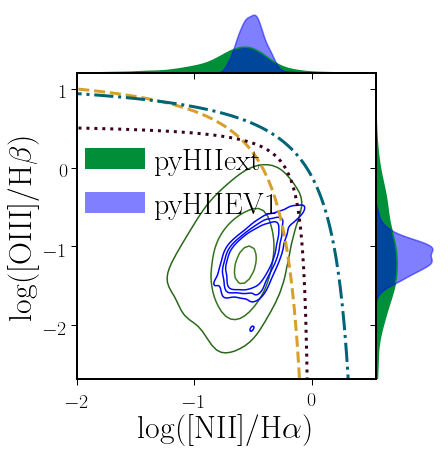

In [39]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(O3_v2.flat)

x_plt2 = np.array(N2_v1.flat)
y_plt2 = np.array(O3_v1.flat)

x_min1=-4
x_max1=0.45
y_min1=-2.7
y_max1=1.2

x=np.linspace(x_min1,x_max1,500)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y5_ce=0.13/(x-0.003)+0.57
cut_y_SII=0.72/(x-0.32)+1.3;
cut_y_SII_ce=0.04/(x+0.012)+0.58
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OI_ce=0.056/(x+0.40)+0.61
cut_y_OIII_AGNs=1.14*(x)+0.36;


maska2 = (x_plt2>=-500)&(x_plt2<=500)& (y_plt2>=-500)&(y_plt2<=500)
maska1 = (x_plt>=-500)&(x_plt<=500)& (y_plt>=-500)&(y_plt<=500)

x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]

df = pd.DataFrame({"x":x_plt,"y":y_plt})


ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0,vmax=20, xlim=[x_min1+2,x_max1+0.1], ylim=[y_min1,y_max1],shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color":'#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])

ax.x = x_plt2
ax.y = y_plt2

ax.plot_joint(sns.kdeplot, cmap='winter', vmin=0,vmax=20, shade=False,  shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])

ax.ax_joint.plot(x[x<-0.01], cut_y3[x<-0.01], '#D6A02B', linestyle='--', linewidth=3)
ax.ax_joint.plot(x,cut_y4, c='#006476',linestyle='-.',linewidth=3)
ax.ax_joint.plot(x[x<-0.01],cut_y5_ce[x<-0.01],c="#3b001d", linestyle=':',linewidth=3)


ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)',r'log([OIII]/H$\beta$)', size=32)
ax.plot_marginals(sns.kdeplot, color='b',shade=True, alpha=0.5)

plt.subplots_adjust(left=0.17, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
plt.legend(['pyHIIext', 'pyHIIEV1'],  loc='3', bbox_to_anchor=(-1.2, 0.85), prop={'size': 30})
plt.savefig(output+"bpt_v1.pdf")
plt.savefig(output+"bpt_v1.png")

plt.show()

<Figure size 432x288 with 0 Axes>

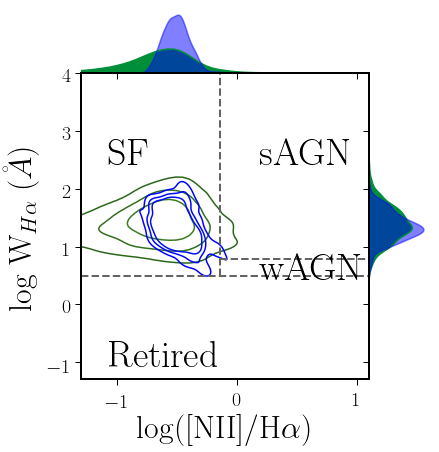

In [40]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(log_EWHa_v2.flat)

x_plt2 = np.array(N2_v1.flat)
y_plt2 = np.array(log_EWHa_v1.flat)

x_min=-1.3
x_max=1.1
y_min=-1.3
y_max=4
        
fig = plt.figure()
    
maska2 = (x_plt2>=-5000)&(x_plt2<=5000)&(y_plt2>=-5000)&(y_plt2<=5000)
maska1 = (x_plt>=-5000)&(x_plt<=5000)&(y_plt>=-5000)&(y_plt<=5000)
x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]
df = pd.DataFrame({"x":x_plt,"y":y_plt})  
    
ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0, vmax=20, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                 shade_lowest=False, alpha=1, marginal_kws={"color": '#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])
    
ax.x = x_plt2
ax.y = y_plt2
ax.plot_joint(sns.kdeplot, cmap='winter', vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])
ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)', r'log W$_{H\alpha}$ ($\AA$)', size=32)
ax.plot_marginals(sns.kdeplot, color='b', shade=True, alpha=0.5)

ax.ax_joint.plot((-0.14,-0.14), (0.5,y_max) ,c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((-0.14,x_max), (0.79,0.79), c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((x_min,x_max), (0.5,0.5), c='#646464', ls="--", linewidth=2)

plt.text(0.25, 1.0, 'SF', fontsize=38, fontweight=800,transform=fig.transFigure)
plt.text(0.6, 1.0, 'sAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.6, 0.6, 'wAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.25, 0.3, 'Retired', fontsize=38, fontweight=800, transform=fig.transFigure)

plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)

plt.savefig(output+"whan_v1.pdf")
plt.savefig(output+"whan_v1.png")

plt.show()


In [41]:
bpt_v1= mpimg.imread(output+'bpt_v1.png')
whan_v1= mpimg.imread(output+'whan_v1.png')

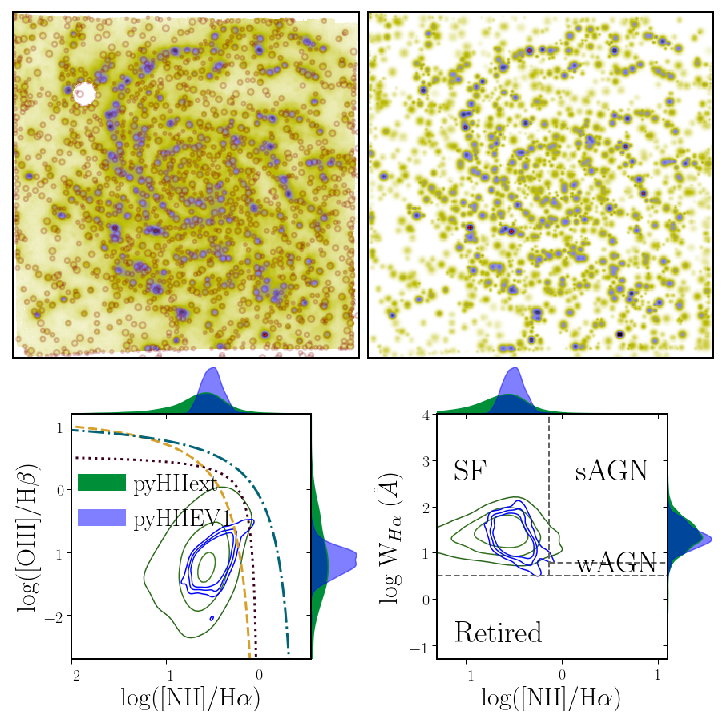

In [42]:
fig, ax = plt.subplots(2,2,figsize=(10,10))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0][0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_final:
            y, x, r = blob
            c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
            ax[0][0].add_patch(c)
            
ax[0][1].imshow(image_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)

ax[1][0].imshow(bpt_v1, interpolation='none')

ax[1][1].imshow(whan_v1, interpolation='none')
        

ax[1][0].axis('off')
ax[1][1].axis('off')
        
ax[0][0].set_xlim(0,nx)
ax[0][0].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(output+'NGC4030'+'_v1.pdf')
plt.savefig(output+'NGC4030'+'_v1.png')

plt.show()


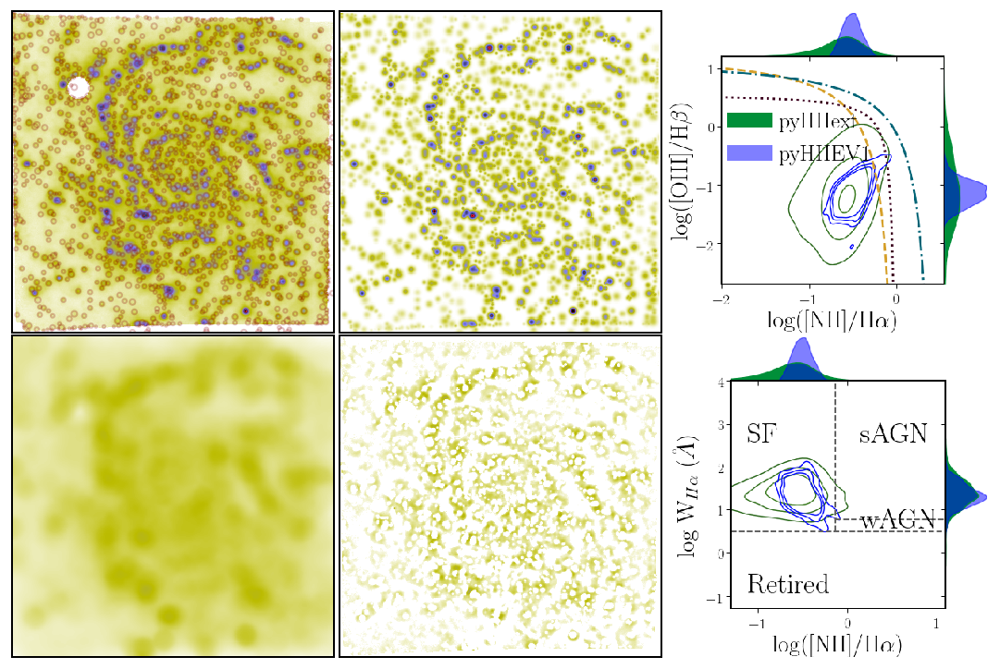

In [43]:
res_map = F_Ha_MUSE-(image_HII+diff_map_final)

fig, ax = plt.subplots(2,3,figsize=(15,10))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0][0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_final:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0][0].add_patch(c)
        
ax[0][1].imshow(image_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[0][2].imshow(bpt_v1, interpolation='none')
        
ax[1][0].imshow(diff_map_final, interpolation='none', cmap=cmap, label=r'Diffuse',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[1][1].imshow(res_map, interpolation='none', cmap=cmap, label=r'Diffuse',
                      norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[1][2].imshow(whan_v1, interpolation='none')

ax[0][2].axis('off')
ax[1][2].axis('off')

ax[0][0].set_xlim(0,nx)
ax[0][0].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[1][0].set_xlim(0,nx)
ax[1][0].set_ylim(0,ny)

ax[1][1].set_xlim(0,nx)
ax[1][1].set_ylim(0,ny)

        
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.01)
plt.savefig('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer'+'/'+'NGC4030'+'_pv2andpv1.pdf')
plt.show()


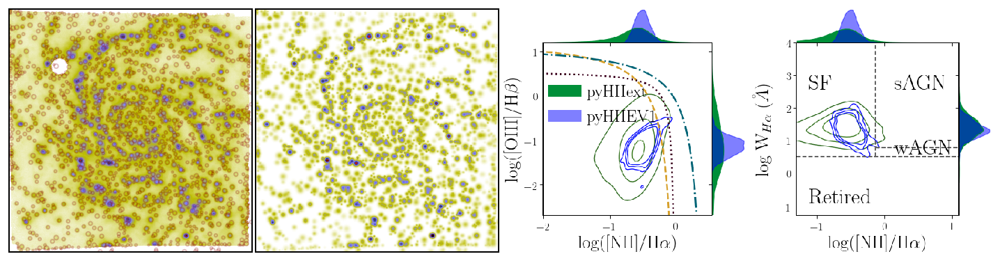

In [44]:
fig, ax = plt.subplots(1,4,figsize=(20,5))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_final:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0].add_patch(c)
        
ax[1].imshow(image_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[2].imshow(bpt_v1, interpolation='none')
        
ax[3].imshow(whan_v1, interpolation='none')

ax[2].axis('off')
ax[3].axis('off')

ax[0].set_xlim(0,nx)
ax[0].set_ylim(0,ny)

ax[1].set_xlim(0,nx)
ax[1].set_ylim(0,ny)

        
    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(output+'NGC4030'+'_PV2ANDPV1'+'.pdf')
plt.savefig(output+'NGC4030''_PV2ANDPV1'+'.png')

plt.show()


In [45]:

#
#
#fig, axes = plt.subplots(1,3,figsize=(12,5), sharey=True, squeeze=False)
#x_min1=-1.79
#x_max1=0.39
#y_min1=-2.49
#y_max1=1.19


#x=np.linspace(2*x_min1,2*x_max1,100)
#cut_y=-0.7+0.2-3.67*x
#cut_y2=-1.7+0.5-3.67*x
#cut_y3=0.61/(x-0.05)+1.3
#cut_y4=0.61/(x-0.47)+1.19
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII_AGNs=1.89*(x)+0.76;
#cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
#cut_y_OI_AGNs=1.18*(x)+1.30;
#cut_y_OIII_AGNs=1.14*(x)+0.36;
#l_EW_min=-0.5
#l_EW_max=2.5
#cm = plt.cm.get_cmap('jet_r')

#cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)

#axes[0,0].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,0].plot(x,cut_y4,'b-')
#axes[0,1].plot(x[x<0.1],cut_y_SII[x<0.1],'b-')
#axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'b-')


#plt.rcParams.update({'font.size': 16})
#axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
#axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
#axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
#axes[0,2].set_xlabel(r'log([Oi]/H$\alpha$)')
#axes[0,0].set_xlim(x_min1,x_max1)
#axes[0,1].set_xlim(x_min1+0.4,x_max1)
#axes[0,2].set_xlim(x_min1-1.1,x_max1-0.2)
#axes[0,0].set_ylim(y_min1,y_max1)


#cb=add_colorbar(cax3)
#cb.set_label(r'$log|EW(H\alpha)|$')

#print(N2)
#plt.subplots_adjust(wspace=0)
#plt.show()

In [46]:
import os

# IMPORTANT!!
# DIST_MPC
dist_mpc = 21 #NGC4030
hdu = fits.PrimaryHDU(F_Ha_MUSE)
DIR = '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_HIIphot/'

hdu.writeto(DIR+'Ha_map.fits',overwrite=True)
hdu_cont = fits.PrimaryHDU(V_MUSE)
hdu_cont.writeto(DIR+'V_map.fits',overwrite=True)
hdu_sum = fits.PrimaryHDU(F_Ha_MUSE+(V_MUSE))
hdu_sum.writeto(DIR+'cont_map.fits',overwrite=True)


In [47]:
#open('HIIphot.in', 'rw')
with open(DIR+'HIIphot.in', 'w') as file:
    file.write('source          = HIIphot v5.1\n')
    file.write('hs_filename     = '+DIR+'Ha_map.fits\n')
    file.write('c_filename      = '+DIR+'V_map.fits\n')
    file.write('h_filename      = '+DIR+'cont_map.fits\n')
    file.write('b_filename      = NULL\n')
    file.write('gc              = 1.000e+00\n')
    file.write('nc              = 1.000e+00\n')
    file.write('sc              = 1.000e+00\n')
    file.write('ghc             = 1.000e+00\n')
    file.write('nhc             = 1.000e+00\n')
    file.write('shc             = 1.000e+00\n')
    file.write('sh              = 1.000e+00\n')
    file.write('sh_em           = 1.000e+00\n')
    file.write('[NII]percent    = 0.000e+00\n')
    file.write('dist_mpc        = '+str(dist_mpc)+'\n')
    file.write('scale           = 0.200000\n')
    file.write('sigma_find      = 1.000e-45\n')
    file.write('PSFfwhm_pix     = 5.000e+00\n')
    file.write('size_max_pc     = -2\n')
    file.write('bkgd_annulus_pc = 1.000e+02\n')
    file.write('do_congrid      = 0\n')
    file.write('root            = HIIphot\n')
    file.write('dump_stamps     = \n')
    file.write('footprint_lev   = 1.000e-01\n')
    file.write('seed_lev        = 1.000e-01\n')
    file.write('f_remain_crit   = 1.000e-01\n')
    file.write('rho_crit        = 0.0\n')
    file.write('termgrad        = 1.500e+00\n')
    file.write('termgrad        = 1.500e+00\n')

with open(DIR+'HIIphot.sh', 'w') as file:

    file.write('gdl << EOF\n')
    file.write('.comp /home/alugo/opt/gdl-astrolib/DavePro/IDL/HIIphot\n')
    file.write("HIIphot,BATCH='"+DIR+"HIIphot.in'\n")
    file.write('exit\n')
    file.write('EOF\n')

with open('HIIphot.ROI_analysis.dat', 'w') as file:
    
    file.write('; Region of Interest (ROI) Dump File\n')
    file.write('; Polygon Information:\n')
    file.write('NVERTS  = 4\n')
    file.write('NPIXELS = \n')
    file.write('COUNTS  = \n')
    file.write('; List of Vertices follows:\n')
    file.write('9.90000e-01 9.90000e-01\n')
    file.write(str(nx+1)+' 9.90000e-01\n')
    file.write(str(nx+1)+' '+str(ny+1)+'\n')
    file.write('9.90000e-01 '+str(ny+1)+'\n')
    
#os.system('ls -l > test.txt')   
print("Start running HIIphot")
os.system("bash "+DIR+"HIIphot.sh > "+DIR+"HIIphot.out") 
print("Finishing running HIIphot")
file = open(DIR+'HIIphot.out', 'r') 
Lines = file.readlines() 
for line in Lines: 
    print(line.rstrip())

Start running HIIphot
Finishing running HIIphot
% Compiled module: LOADCT.
% LOADCT: Loading table B-W LINEAR

*********************************************
** Personal settings are loaded and active **
*********************************************

% Compiled module: INDEX2COORD.
% Compiled module: COORD2INDEX.
% Compiled module: COORD2COORD.
% Compiled module: HIIPHOT.
% Compiled module: HIIPHOT_BATCH.
% Compiled module: SELECT_IMAGES.
% Compiled module: PSEUDO_LINECONTINUUM.
% Compiled module: GET_REGIONS.
% Compiled module: GET_FIND_INPUTS.
% Compiled module: CORR_STATISTICS_2D.
% Compiled module: SYM_MODEL.
% Compiled module: DISTORT.
% Compiled module: UPDATE_MAP_FILES.
% Compiled module: CHANGE_FILENAMES.
% Compiled module: ESTIMATE_ERROR_BEG.
% Compiled module: ESTIMATE_ERROR_END.
% Compiled module: DRAWBORDERS.
% Compiled module: GROWTH_SET.
% Compiled module: ECHO_HELP.
% Compiled module: FIND_MOD.
STARTING
% Compiled module: ASTROLIB.
% ASTROLIB: Astronomy Library system var

Regions detected by HIIphot: 283
283


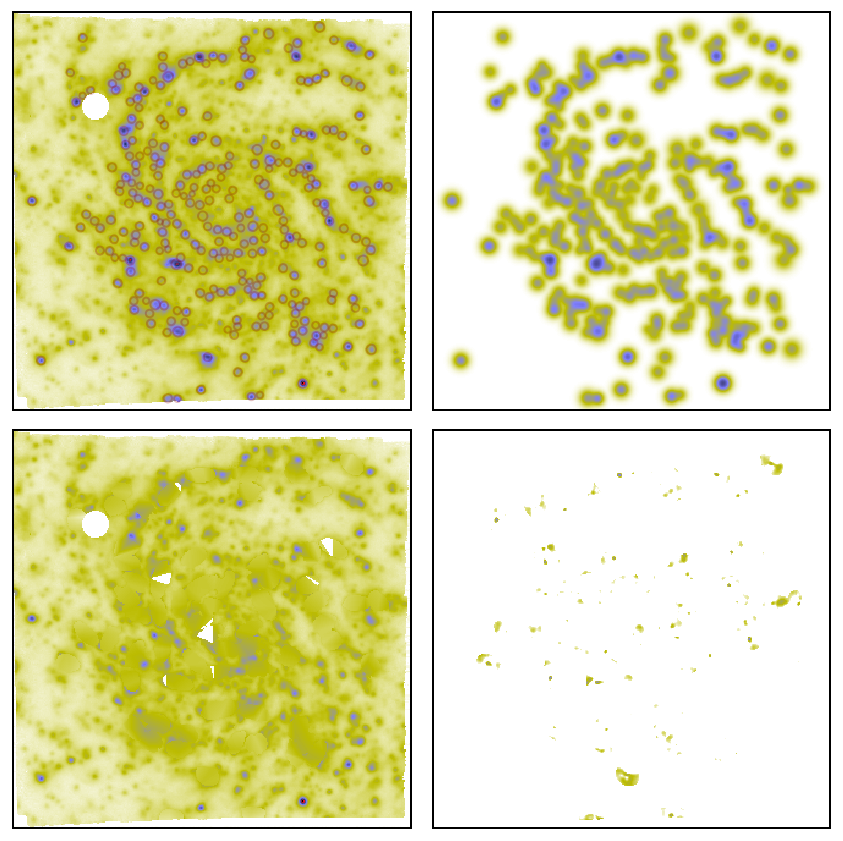

In [48]:
from photutils import source_properties, EllipticalAperture

fig, ax = plt.subplots(2,2,figsize=(15,15))
file="HIIphot.SEED.MAP.fits"
hdu_seed=fits.open(file)
data_seed=hdu_seed[0].data
hdr_seed=hdu_seed[0].header

file="HIIphot.BKGD.fits"
hdu_bkgd=fits.open(file)
data_bkgd=hdu_bkgd[0].data
hdr_bkgd=hdu_bkgd[0].header

data_mod = F_Ha_MUSE-data_bkgd


cat = source_properties(F_Ha_MUSE, data_seed)
#print(cat)

n_reg=np.amax(data_seed)

print('Regions detected by HIIphot:',n_reg)
cmap = 'gist_stern_r'
im_Ha_MUSE=ax[0][0].imshow(F_Ha_MUSE, interpolation='none',\
                     cmap=cmap, label=r'H$\alpha$',\
                     norm=colors.PowerNorm(gamma=0.5))#,label=r'H$\alpha$') ç
clim=im_Ha_MUSE.properties()['clim']
ax[1][0].imshow(data_bkgd, interpolation='none',\
                             cmap=cmap, label=r'Hii regions',\
                             norm=colors.PowerNorm(gamma=0.5),clim=clim) 

#ax[0][1].imshow(data_mod, interpolation='none',\
#                     cmap=cmap, label=r'H$\alpha$',\
#                     norm=colors.PowerNorm(gamma=0.5),clim=clim)#,label=r'H$\alpha$') ç
n_obj=0
X=[]
Y=[]
R=[]
for obj in cat:
    n_obj = n_obj+1
    x = obj.xcentroid.value
    y = obj.ycentroid.value
    r = np.sqrt((data_seed[data_seed==n_obj].sum()/n_obj)/3.1416)/1.4
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0][0].add_patch(c)
    if  (~((np.isnan(x) or np.isinf(x) or np.isnan(y) or np.isinf(y) or np.isnan(r) or np.isinf(r) ))):
        X.append(x)
        Y.append(y)
        R.append(r)

blobs_HIIphot=np.array((Y,X,R))
blobs_HIIphot=np.swapaxes(blobs_HIIphot,0,1)

#print(blobs_HIIphot)

blobs_HIIphot_F_Ha,image_HIIphot_HII,diff_HIIphot_map_final,diff_HIIphot_points,diff_HIIphot_Flux=HIIextraction(F_Ha_MUSE, 
                                                                                                                blobs_HIIphot, kind=0,we=2, FWHM_MUSE = FWHM_MUSE, refined = 0)
#blobs_HIIphot = blobs_HIIphot[blobs_HIIphot_F_Ha/(3.1416*blobs_HIIphot[:,2]**2)>threshold]

blobs_HIIphot = blobs_HIIphot[blobs_HIIphot_F_Ha>1]
blobs_HIIphot_F_Ha = blobs_HIIphot_F_Ha[blobs_HIIphot_F_Ha>1]
print(len(blobs_HIIphot))

image_HIIphot_HII=create_HII_image(blobs_HIIphot,blobs_HIIphot_F_Ha,nx,ny)

clim=im_Ha_MUSE.properties()['clim']
ax[0][1].imshow(image_HIIphot_HII, interpolation='none',\
                     cmap=cmap, label=r'H$\alpha$',\
                     norm=colors.PowerNorm(gamma=0.5),clim=clim)#,label=r'H$\alpha$') ç


ax[1][1].imshow(F_Ha_MUSE-(image_HIIphot_HII+data_bkgd), interpolation='none',\
                     cmap=cmap, label=r'H$\alpha$',\
                     norm=colors.PowerNorm(gamma=0.5),clim=clim)#,label=r'H$\alpha$') ç



    
(ny,nx) = F_Ha_MUSE.shape
for ax_now in ax.reshape(-1):
    ax_now.set_xlim(0,nx)
    ax_now.set_ylim(0,ny)

ax[0][0].axes.yaxis.set_ticklabels([])  
ax[0][1].axes.yaxis.set_ticklabels([])
ax[1][0].axes.yaxis.set_ticklabels([])
ax[1][1].axes.yaxis.set_ticklabels([])
            
ax[0][0].axes.xaxis.set_ticklabels([])    
ax[0][1].axes.xaxis.set_ticklabels([])   
ax[1][0].axes.xaxis.set_ticklabels([])
ax[1][1].axes.xaxis.set_ticklabels([])
        
ax[0][0].set_yticks([])
ax[0][1].set_yticks([])
ax[1][0].set_yticks([])
ax[1][1].set_yticks([])
        
ax[0][0].set_xticks([])
ax[0][1].set_xticks([])
ax[1][0].set_xticks([])
ax[1][1].set_xticks([])

plt.subplots_adjust(wspace=0.005, hspace=0.05)
plt.savefig(DIR+'PHOT.pdf')
plt.show()


In [49]:
print(blobs_HIIphot)

[[241.14756739 283.86306351   3.44316591]
 [ 31.08704109 184.07521764   3.29863241]
 [ 43.09041951 189.85722331   3.44316591]
 [252.05560577  51.82422224   3.32315789]
 [220.91383549 148.04122078   3.3475037 ]
 [ 21.81770042 237.09616219   3.3475037 ]
 [291.13376818 292.01897988   3.29863241]
 [134.14427156  45.8330038    3.3475037 ]
 [225.11488414 244.02201868   3.29863241]
 [ 91.01487078 221.03003219   3.22393671]
 [297.85670829 277.08890438   3.3956717 ]
 [141.07478917 226.22743159   3.29863241]
 [288.79916161 152.29980731   3.44316591]
 [289.36270607 231.81081381   3.24902609]
 [302.94064261 190.02739391   3.29863241]
 [133.85909791 107.72490188   3.24902609]
 [154.80118372 259.00309066   3.3475037 ]
 [ 16.71353664 153.9357652    3.29863241]
 [171.24124694  15.58774905   3.41950126]
 [134.09681754 251.22151633   3.2739232 ]
 [198.99123817 241.89145515   3.3475037 ]
 [213.34360636 289.05719753   3.44316591]
 [143.91263123 141.02103042   3.41950126]
 [184.0928406  136.92100706   3.44

In [50]:
WCS, hdu_HII_phot, table_HII_phot = extracting_flux_elines('NGC4030_phot', hdu_fe, blobs_HIIphot, 
                                                           FWHM_MUSE=1.0,  plot=1)


0   1048  val_now= flux_[FeIII]4754
1   1048  val_now= flux_[FeIII]4769
2   1048  val_now= flux_[FeII]4774
3   1048  val_now= flux_[FeIII]4777
4   1048  val_now= flux_[FeIII]4813
5   1048  val_now= flux_[FeII]4814
6   1048  val_now= flux_Hbeta4861
7   1048  val_now= flux_[FeIII]4881
8   1048  val_now= flux_[FeII]4889
9   1048  val_now= flux_[FeVII]4893
10   1048  val_now= flux_[FeII]4905
11   1048  val_now= flux_HeI4921
12   1048  val_now= flux_[FeIII]4924
13   1048  val_now= flux_[FeIII]4930
14   1048  val_now= flux_[FeVII]4942
15   1048  val_now= flux_[OIII]4958
16   1048  val_now= flux_[FeVI]4972
17   1048  val_now= flux_[FeII]4973
18   1048  val_now= flux_[FeIII]4985
19   1048  val_now= flux_[OIII]5006
20   1048  val_now= flux_HeI5015
21   1048  val_now= flux_[FeII]5039
22   1048  val_now= flux_[FeII]5072
23   1048  val_now= flux_[FeII]5107
24   1048  val_now= flux_[FeII]5111
25   1048  val_now= flux_[FeVI]5145
26   1048  val_now= flux_[FeII]5158
27   1048  val_now= flux_[FeVII]515

233   1048  val_now= vel_[CrII]8357
234   1048  val_now= vel_HI8359
235   1048  val_now= vel_HI8374
236   1048  val_now= vel_HI8392
237   1048  val_now= vel_OI8446
238   1048  val_now= vel_HI8467
239   1048  val_now= vel_CaII8498
240   1048  val_now= vel_HI8502
241   1048  val_now= vel_CaII8542
242   1048  val_now= vel_HI8545
243   1048  val_now= vel_[ClII]8578
244   1048  val_now= vel_HI8598
245   1048  val_now= vel_[FeII]8616
246   1048  val_now= vel_CaII8662
247   1048  val_now= vel_HI8665
248   1048  val_now= vel_[CI]8727
249   1048  val_now= vel_HI8750
250   1048  val_now= vel_HI8862
251   1048  val_now= vel_[FeII]8891
252   1048  val_now= vel_HI9014
253   1048  val_now= vel_[FeII]9033
254   1048  val_now= vel_[FeII]9051
255   1048  val_now= vel_[SIII]9069
256   1048  val_now= vel_[ClII]9123
257   1048  val_now= vel_[FeII]9226
258   1048  val_now= vel_HI9229
259   1048  val_now= vel_OI9266
260   1048  val_now= vel_[FeII]9267
261   1048  val_now= vel_[FeII]9399
262   1048  val_now=

465   1048  val_now= EW_FeI6855
466   1048  val_now= EW_[ArV]7005
467   1048  val_now= EW_HeI7065
468   1048  val_now= EW_[ArIII]7135
469   1048  val_now= EW_[FeII]7155
470   1048  val_now= EW_[FeII]7171
471   1048  val_now= EW_CII7236
472   1048  val_now= EW_HeI7281
473   1048  val_now= EW_[FeI]7290
474   1048  val_now= EW_[CaII]7291
475   1048  val_now= EW_[OII]7318
476   1048  val_now= EW_[CaII]7323
477   1048  val_now= EW_[OII]7329
478   1048  val_now= EW_[NiII]7377
479   1048  val_now= EW_[FeII]7388
480   1048  val_now= EW_[NiII]7411
481   1048  val_now= EW_[FeII]7452
482   1048  val_now= EW_[FeII]7637
483   1048  val_now= EW_[FeII]7686
484   1048  val_now= EW_[FeII]7686
485   1048  val_now= EW_[ArIII]7751
486   1048  val_now= EW_OI7774
487   1048  val_now= EW_[FeXI]7891
488   1048  val_now= EW_[CrII]7999
489   1048  val_now= EW_[CrII]8125
490   1048  val_now= EW_[CrII]8229
491   1048  val_now= EW_HeII8236
492   1048  val_now= EW_[NiII]8300
493   1048  val_now= EW_[CrII]8308
494  

687   1048  val_now= e_vel_[NI]5200
688   1048  val_now= e_vel_[FeII]5220
689   1048  val_now= e_vel_[FeII]5261
690   1048  val_now= e_vel_[FeII]5268
691   1048  val_now= e_vel_[FeIII]5270
692   1048  val_now= e_vel_[FeII]5273
693   1048  val_now= e_vel_[FeVI]5277
694   1048  val_now= e_vel_[FeII]5296
695   1048  val_now= e_vel_[FeXIV]5302
696   1048  val_now= e_vel_[CaV]5309
697   1048  val_now= e_vel_[FeII]5333
698   1048  val_now= e_vel_[FeVI]5335
699   1048  val_now= e_vel_[FeII]5376
700   1048  val_now= e_vel_HeII5411
701   1048  val_now= e_vel_[FeII]5412
702   1048  val_now= e_vel_[FeVI]5424
703   1048  val_now= e_vel_[FeVI]5426
704   1048  val_now= e_vel_[FeVI]5484
705   1048  val_now= e_vel_[ClIII]5517
706   1048  val_now= e_vel_[FeII]5527
707   1048  val_now= e_vel_[OI]5577
708   1048  val_now= e_vel_[FeVI]5631
709   1048  val_now= e_vel_[FeVI]5677
710   1048  val_now= e_vel_[FeVII]5720
711   1048  val_now= e_vel_[NII]5754
712   1048  val_now= e_vel_HeI5876
713   1048  val_now

905   1048  val_now= e_disp_HI8862
906   1048  val_now= e_disp_[FeII]8891
907   1048  val_now= e_disp_HI9014
908   1048  val_now= e_disp_[FeII]9033
909   1048  val_now= e_disp_[FeII]9051
910   1048  val_now= e_disp_[SIII]9069
911   1048  val_now= e_disp_[ClII]9123
912   1048  val_now= e_disp_[FeII]9226
913   1048  val_now= e_disp_HI9229
914   1048  val_now= e_disp_OI9266
915   1048  val_now= e_disp_[FeII]9267
916   1048  val_now= e_disp_[FeII]9399
917   1048  val_now= e_EW_[FeIII]4754
918   1048  val_now= e_EW_[FeIII]4769
919   1048  val_now= e_EW_[FeII]4774
920   1048  val_now= e_EW_[FeIII]4777
921   1048  val_now= e_EW_[FeIII]4813
922   1048  val_now= e_EW_[FeII]4814
923   1048  val_now= e_EW_Hbeta4861
924   1048  val_now= e_EW_[FeIII]4881
925   1048  val_now= e_EW_[FeII]4889
926   1048  val_now= e_EW_[FeVII]4893
927   1048  val_now= e_EW_[FeII]4905
928   1048  val_now= e_EW_HeI4921
929   1048  val_now= e_EW_[FeIII]4924
930   1048  val_now= e_EW_[FeIII]4930
931   1048  val_now= e_EW_

In [51]:
Ha_ph=table_HII_phot['flux_Halpha6562'] 
Hb_ph=table_HII_phot['flux_Hbeta4861']
OIII_ph=table_HII_phot['flux_[OIII]4958']
NII_ph=table_HII_phot['flux_[NII]6583']
SII_1_ph=table_HII_phot['flux_[SII]6716']
SII_2_ph=table_HII_phot['flux_[SII]6730']
SII_ph=SII_1_ph+SII_2_ph
OI_ph=table_HII_phot['flux_[OI]6300']
EWHa_ph = table_HII_phot['EW_Halpha6562']

O3_ph=np.log10(OIII_ph)-np.log10(Hb_ph)
N2_ph=np.log10(NII_ph)-np.log10(Ha_ph)
S2_ph=np.log10(SII_ph/Ha_ph)
O1_ph=np.log10(OI_ph/Ha_ph)

log_EWHa_ph=np.log10(np.abs(EWHa_ph))
#mask_Ha = Ha_ph>-100


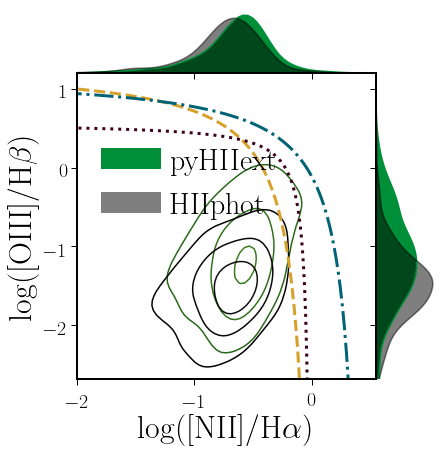

In [52]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(O3_v2.flat)

x_plt2 = np.array(N2_ph.flat)
y_plt2 = np.array(O3_ph.flat)

x_min1=-4
x_max1=0.45
y_min1=-2.7
y_max1=1.2

x=np.linspace(x_min1,x_max1,500)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y5_ce=0.13/(x-0.003)+0.57
cut_y_SII=0.72/(x-0.32)+1.3;
cut_y_SII_ce=0.04/(x+0.012)+0.58
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OI_ce=0.056/(x+0.40)+0.61
cut_y_OIII_AGNs=1.14*(x)+0.36;


maska2 = (x_plt2>=-500)&(x_plt2<=500)& (y_plt2>=-500)&(y_plt2<=500)
maska1 = (x_plt>=-500)&(x_plt<=500)& (y_plt>=-500)&(y_plt<=500)

x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]

df = pd.DataFrame({"x":x_plt,"y":y_plt})


ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0,vmax=20, xlim=[x_min1+2,x_max1+0.1], ylim=[y_min1,y_max1],shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color":'#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])

ax.x = x_plt2
ax.y = y_plt2

ax.plot_joint(sns.kdeplot, cmap='Greys_r', vmin=0,vmax=20, shade=False,  shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])

ax.ax_joint.plot(x[x<-0.01], cut_y3[x<-0.01], '#D6A02B', linestyle='--', linewidth=3)
ax.ax_joint.plot(x,cut_y4, c='#006476',linestyle='-.',linewidth=3)
ax.ax_joint.plot(x[x<-0.01],cut_y5_ce[x<-0.01],c="#3b001d", linestyle=':',linewidth=3)


ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)',r'log([OIII]/H$\beta$)', size=32)
ax.plot_marginals(sns.kdeplot, color='k',shade=True, alpha=0.5)

plt.subplots_adjust(left=0.17, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
plt.legend(['pyHIIext', 'HIIphot'],  loc='3', bbox_to_anchor=(-1.2, 0.85), prop={'size': 30})
plt.savefig(DIR+"bpt_phot.pdf")
plt.savefig(DIR+"bpt_phot.png")

plt.show()

<Figure size 432x288 with 0 Axes>

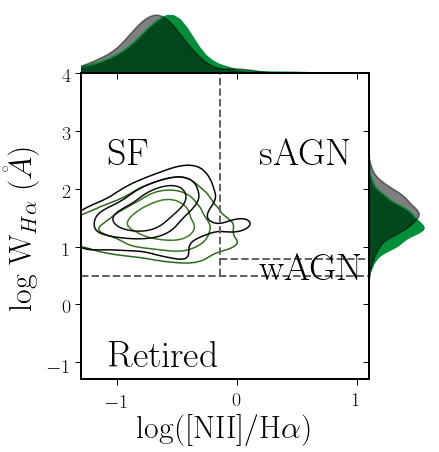

In [53]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(log_EWHa_v2.flat)

x_plt2 = np.array(N2_ph.flat)
y_plt2 = np.array(log_EWHa_ph.flat)

x_min=-1.3
x_max=1.1
y_min=-1.3
y_max=4
        
fig = plt.figure()
    
maska2 = (x_plt2>=-5000)&(x_plt2<=5000)&(y_plt2>=-5000)&(y_plt2<=5000)
maska1 = (x_plt>=-5000)&(x_plt<=5000)&(y_plt>=-5000)&(y_plt<=5000)
x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]
df = pd.DataFrame({"x":x_plt,"y":y_plt})  
    
ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0, vmax=20, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                 shade_lowest=False, alpha=1, marginal_kws={"color": '#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])
    
ax.x = x_plt2
ax.y = y_plt2
ax.plot_joint(sns.kdeplot, cmap='Greys_r', vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])
ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)', r'log W$_{H\alpha}$ ($\AA$)', size=32)
ax.plot_marginals(sns.kdeplot, color='k', shade=True, alpha=0.5)

ax.ax_joint.plot((-0.14,-0.14), (0.5,y_max) ,c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((-0.14,x_max), (0.79,0.79), c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((x_min,x_max), (0.5,0.5), c='#646464', ls="--", linewidth=2)

plt.text(0.25, 1.0, 'SF', fontsize=38, fontweight=800,transform=fig.transFigure)
plt.text(0.6, 1.0, 'sAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.6, 0.6, 'wAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.25, 0.3, 'Retired', fontsize=38, fontweight=800, transform=fig.transFigure)

plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)

plt.savefig(DIR+"whan_phot.pdf")
plt.savefig(DIR+"whan_phot.png")

plt.show()


In [54]:
bpt_phot= mpimg.imread(DIR+'bpt_phot.png')
whan_phot= mpimg.imread(DIR+'whan_phot.png')

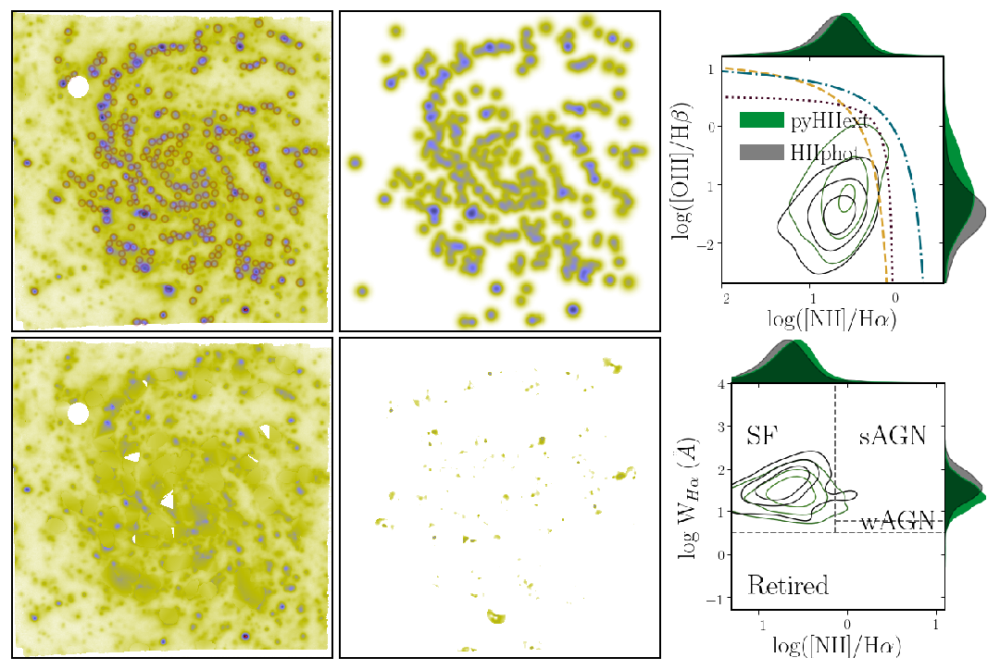

In [55]:
fig, ax = plt.subplots(2,3,figsize=(15,10))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0][2].imshow(bpt_phot, interpolation='none')
        
ax[1][0].imshow(data_bkgd, interpolation='none', cmap=cmap, label=r'Diffuse',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)

res_phot=F_Ha_MUSE-(image_HIIphot_HII+data_bkgd)

ax[1][1].imshow(res_phot, interpolation='none', cmap=cmap, label=r'Diffuse',
                      norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[1][2].imshow(whan_phot, interpolation='none')

ax[0][0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))

n_obj=0
X=[]
Y=[]
R=[]
for obj in cat:
    n_obj = n_obj+1
    x = obj.xcentroid.value
    y = obj.ycentroid.value
    r = np.sqrt((data_seed[data_seed==n_obj].sum()/n_obj)/3.1416)/1.4
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0][0].add_patch(c)

                
ax[0][1].imshow(image_HIIphot_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)

ax[0][0].set_xlim(0,nx)
ax[0][0].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

ax[1][0].set_xlim(0,nx)
ax[1][0].set_ylim(0,ny)

ax[1][1].set_xlim(0,nx)
ax[1][1].set_ylim(0,ny)


ax[0][2].axis('off')
ax[1][2].axis('off')
        
    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(DIR+'NGC4030'+'_phot.pdf')
plt.savefig(DIR+'NGC4030'+'_phot.png')

plt.show()


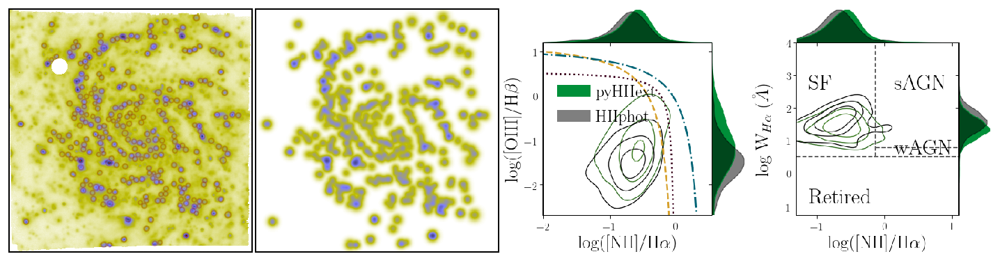

In [56]:
fig, ax = plt.subplots(1,4,figsize=(20,5))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_HIIphot:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0].add_patch(c)
        
ax[1].imshow(image_HIIphot_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.5),clim=clim)
        
ax[2].imshow(bpt_phot, interpolation='none')
        
ax[3].imshow(whan_phot, interpolation='none')

ax[2].axis('off')
ax[3].axis('off')

ax[0].set_xlim(0,nx)
ax[0].set_ylim(0,ny)

ax[1].set_xlim(0,nx)
ax[1].set_ylim(0,ny)

        
    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(DIR+'NGC4030'+'_HIIPHOT'+'.pdf')
plt.savefig(DIR+'NGC4030'+'_HIIPHOT'+'.png')

plt.show()


In [57]:
#whan_pyhiiexplorerv2=create_whan(N2, log_EWHa, 'winter', 'b',  -1.2, 1, -1.3, 4,
#                                 'whan_pyhiiexplorerv2', DIR= '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_sextractor/')


In [58]:

#
#
#fig, axes = plt.subplots(1,3,figsize=(12,5), sharey=True, squeeze=False)
#x_min1=-1.79
#x_max1=0.39
#y_min1=-2.49
#y_max1=1.19


#x=np.linspace(2*x_min1,2*x_max1,100)
#cut_y=-0.7+0.2-3.67*x
#cut_y2=-1.7+0.5-3.67*x
#cut_y3=0.61/(x-0.05)+1.3
#cut_y4=0.61/(x-0.47)+1.19
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII=0.61/(x-0.3)+1.3;
#cut_y_SII_AGNs=1.89*(x)+0.76;
#cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
#cut_y_OI_AGNs=1.18*(x)+1.30;
#cut_y_OIII_AGNs=1.14*(x)+0.36;
#l_EW_min=0
#l_EW_max=3
#cm = plt.cm.get_cmap('jet_r')

#cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)
#cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],c=log_EWHa[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=l_EW_min, vmax=l_EW_max)

#axes[0,0].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,0].plot(x,cut_y4,'b-')
#axes[0,1].plot(x[x<0.1],cut_y_SII[x<0.1],'b-')
#axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'b-')

#plt.rcParams.update({'font.size': 16})
#axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
#axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
#axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
#axes[0,2].set_xlabel(r'log([Oi]/H$\alpha$)')
#axes[0,0].set_xlim(x_min1,x_max1)
#axes[0,1].set_xlim(x_min1+0.4,x_max1)
#axes[0,2].set_xlim(x_min1-1.1,x_max1-0.2)
#axes[0,0].set_ylim(y_min1,y_max1)


#cb=add_colorbar(cax3)
#cb.set_label(r'$log|EW(H\alpha)|$')

#print(N2)
#plt.subplots_adjust(wspace=0)
#plt.show()

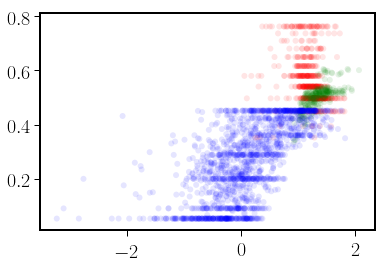

In [59]:
plt.scatter(np.log10(blobs_sew_F_Ha),np.log10(blobs_sew[:,2]), c="r", alpha=0.1, edgecolor='none')
plt.scatter(np.log10(blobs_HIIphot_F_Ha),np.log10(blobs_HIIphot[:,2]), c="g", alpha=0.1, edgecolor='none')
plt.scatter(np.log10(blobs_F_Ha),np.log10(blobs_final[:,2]),c="b", alpha=0.1, edgecolor='none')
plt.show()

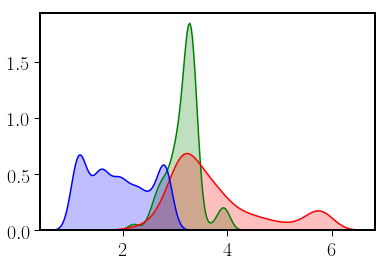

In [60]:
ax_hist_rad=sns.distplot(blobs_HIIphot[:,2], hist=False, color="g", kde_kws={"shade": True})
sns.distplot(blobs_sew[:,2], hist=False, color="r", ax=ax_hist_rad, kde_kws={"shade": True})
sns.distplot(blobs_final[:,2], hist=False, color="b", ax=ax_hist_rad,  kde_kws={"shade": True})
plt.show()

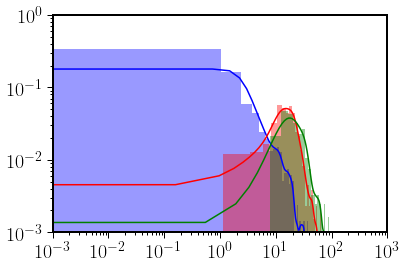

In [61]:
ax_hist_lum=sns.distplot(blobs_F_Ha, color='b')
sns.distplot(blobs_sew_F_Ha, color="r", ax=ax_hist_lum)
sns.distplot(blobs_HIIphot_F_Ha, color="g", ax=ax_hist_lum)

ax_hist_lum.set_yscale('log')
ax_hist_lum.set_xscale('log')
ax_hist_lum.set_xlim(10**-3,10**3)
ax_hist_lum.set_ylim(10**-3,10**0)


plt.show()

In [89]:
from astropy.io import fits
from astrodendro import Dendrogram, pp_catalog
from astrodendro.analysis import PPStatistic

F_Ha_MUSE=data[67,:,:]

338


(0, 326)

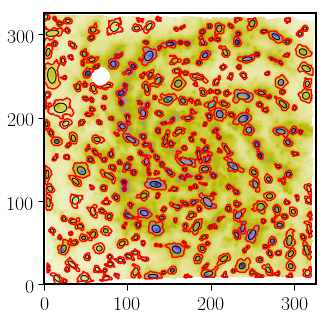

In [90]:
cmap='gist_stern_r'
(ny,nx) = F_Ha_MUSE.shape
d = Dendrogram.compute(F_Ha_MUSE,  min_value=0,  min_npix=20, min_delta=0.00001)
p = d.plotter()

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1, 1, 1)

ax.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, 
                norm=colors.PowerNorm(gamma=0.5))

for leaf in d.leaves:

    p.plot_contour(ax, structure=leaf, lw=0.1, colors='red')

    s = PPStatistic(leaf)
    ellipse = s.to_mpl_ellipse(edgecolor='k', facecolor='none')
    #print(ellipse)
    #print(ellipse)
    ax.add_patch(ellipse)
    #print(ellipse)

print(len(d.leaves))
ax.set_xlim(0, nx)
ax.set_ylim(0, ny)

In [91]:
len(d)
hojas=d.leaves
len(hojas)

338

In [65]:
#print(ellipse)
#Ellipse=Ellipse(width=4)
#print(ellipse)
#sns.distplot(ellipse[0])


In [92]:
from astropy import units as u
metadata = {}
metadata['data_unit'] = u.Jy / u.beam
metadata['spatial_scale'] =  1.0 * u.arcsec
metadata['beam_major'] =  1* u.arcsec
metadata['beam_minor'] =  0.7* u.arcsec

cat = pp_catalog(hojas, metadata)
cat.pprint(show_unit=True, max_lines=1)




Computing catalog for 338 structures

[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 2%
[>                                        ] 2%
[=>                                       ] 2%
[=>                                       ] 2%
[=>                                       ] 3%
[=>                                       ] 3%
[=>                                       ] 3%
[=>                                       ] 4%
[=>                                       ] 4%
[=>                                       ] 4%
[==>                                      ] 5%
[==>                                      ] 5%
[==>                                      ] 5%
[==>                                      ] 5%
[==>                  

[====================>                    ] 50%
[====================>                    ] 50%
[====================>                    ] 51%
[====================>                    ] 51%
[====================>                    ] 51%
[====================>                    ] 52%
[====================>                    ] 52%
[=====================>                   ] 52%
[=====================>                   ] 52%
[=====================>                   ] 53%
[=====================>                   ] 53%
[=====================>                   ] 53%
[=====================>                   ] 54%
[=====================>                   ] 54%
[=====================>                   ] 54%
[======================>                  ] 55%
[======================>                  ] 55%
[======================>                  ] 55%
[======================>                  ] 55%
[======================>                  ] 56%
[======================>                

In [93]:
flux_astrodendro=cat['flux']
y_ad=cat['y_cen']
x_ad=cat['x_cen']
rad_ad=cat['radius']


blobs_ad=np.array((y_ad,x_ad,rad_ad))
blobs_ad=np.swapaxes(blobs_ad,0,1)

image_seg_ad=create_HII_seg(blobs_ad, nx, ny)

#plt.imshow(image_seg_ad)
#plt.show()

data_seed_ad=image_seg_ad



cat = source_properties(F_Ha_MUSE, data_seed_ad)


n_obj=0
X=[]
Y=[]
R=[]
for obj in cat:
    n_obj = n_obj+1
    x = obj.xcentroid.value
    y = obj.ycentroid.value
    r = np.sqrt((data_seed[data_seed==n_obj].sum()/n_obj)/3.1416)/1.4
    if  (~((np.isnan(x) or np.isinf(x) or np.isnan(y) or np.isinf(y) or np.isnan(r) or np.isinf(r) ))):
        X.append(x)
        Y.append(y)
        R.append(r)

blobs_astrodendro=np.array((Y,X,R))
#print(blobs_astrodendro)
blobs_astrodendro=np.swapaxes(blobs_astrodendro,0,1)
#print(blobs_astrodendro)


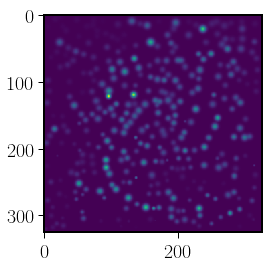

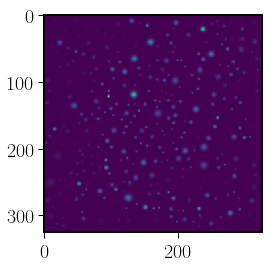

In [94]:
blobs_ad_F_Ha,image_ad_old_HII,diff_ad_old_map_final,diff_ad_old_points,diff_ad_old_Flux=HIIextraction(F_Ha_MUSE,blobs_ad, 
                                                                                       kind=0,we=2,
                                                                                       FWHM_MUSE = 1, 
                                                                                       refined = 0)


blobs_add_F_Ha,image_ad_HII,diff_ad_map_final,diff_ad_points,diff_ad_Flux=HIIextraction(F_Ha_MUSE,blobs_astrodendro, 
                                                                                       kind=0,we=2,
                                                                                       FWHM_MUSE = 1, 
                                                                                       refined = 0)
plt.imshow(image_ad_HII)
plt.show()
plt.imshow(image_ad_old_HII)



In [69]:
#blobs_ad_ad=blobs_ad
#dist_ad,index_ad = do_kdtree(blobs_ad[:,0:2],blobs_ad_ad[:,0:2], k=1)
#mask_HII_ad = (dist_ad<3.5*blobs_ad_ad[:,2])
#blobs_ad_ad = blobs_ad[mask_HII_ad]
#blobs_final_ad=np.concatenate((blobs_ad,blobs_ad_ad), axis=0)
#mask_rad=blobs_final_ad[:,2]<=2
#blobs_ad=blobs_final_ad[mask_rad]



In [70]:
#ax_hist_rad=sns.distplot(blobs_HIIphot[:,2], hist=False, color="g", kde_kws={"shade": True})
#sns.distplot(blobs_sew[:,2], hist=False, color="r", ax=ax_hist_rad, kde_kws={"shade": True})
#sns.distplot(blobs_final[:,2], hist=False, color="b", ax=ax_hist_rad,  kde_kws={"shade": True})
#sns.distplot(blobs_ad[:,2], hist=False, color="y", kde_kws={"shade": True})

#plt.show()

In [95]:
#radi_ad=[]
#for ra in rad_ad:
#    if ra < 5:
#        radi_ad.append(ra)
#    else:
#        ra=5
#        radi_ad.append(ra)

#rad_ad = Table(data=[radi_ad], names=['radius'])

#print(rad_ad)
#rad_ad=rad_ad['radius']
#sns.distplot(rad_ad)


def do_kdtree(combined_x_y_arrays,points,k=1):
    mytree = cKDTree(combined_x_y_arrays)
    dist, indexes = mytree.query(points,k=k)
    return np.array(dist),np.array(indexes)


338


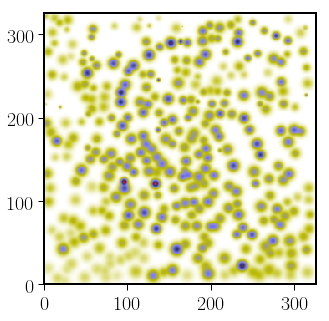

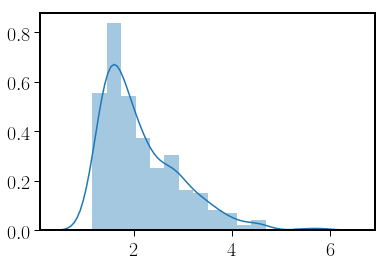

In [96]:
#mask_rad=rad_ad<=3.5

#blobs_ad=np.array((y_ad,x_ad,rad_ad))
#blobs_ad=np.swapaxes(blobs_ad,0,1)
#blobs_ad_ad=blobs_ad
#dist_ad,index_ad = do_kdtree(blobs_ad[:,0:2],blobs_ad_ad[:,0:2], k=1)
#mask_HII_ad = (dist_ad<3.5*blobs_ad_ad[:,2])
#blobs_ad_ad = blobs_ad[mask_HII_ad]
#blobs_final_ad=np.concatenate((blobs_ad,blobs_ad_ad), axis=0)

#mask_rad=blobs_final_ad[:,2]<=3
#blobs_ad=blobs_final_ad[mask_rad]

#blobs_ad_F_Ha,image_ad_HII,diff_ad_map_final,diff_ad_points,diff_ad_Flux=HIIextraction(F_Ha_MUSE,blobs_ad, 
#                                                                                       kind=0,we=2,
#                                                                                      FWHM_MUSE = 1, 
#                                                                                       refined = 0)


#blobs_ad = blobs_ad[(blobs_ad_F_Ha>0)  ]#& (blobs_ad_F_Ha<100)]
#blobs_ad_F_Ha = blobs_ad_F_Ha[(blobs_ad_F_Ha>0)  ]#& (blobs_ad_F_Ha<100)]
print(len(blobs_ad))

#blobs_ad = blobs_ad[blobs_ad_F_Ha>1]
#blobs_ad_F_Ha = blobs_ad_F_Ha[blobs_ad_F_Ha>1]

##dist_HII_self,index_HII_self = do_kdtree(blobs_ad[:,0:2],blobs_ad[:,0:2],k=1)
#mask_HII_self = (dist_HII_self>blobs_ad[:,2]) 
#blobs_ad = blobs_ad[mask_HII_self]

#blobs_F_ad =np.array(flux_astrodendro)
#plt.imshow(image_ad_HII) 
#print(blobs_ad)
#plt.scatter(np.log10(blobs_ad_F_Ha),np.log10(blobs_ad[:,2]))

#image_ad_HII=create_HII_image(blobs_ad,blobs_ad_F_Ha,ny,nx)



fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1, 1, 1)

#for leaf in d.leaves:

#    p.plot_contour(ax, structure=leaf, lw=0.1, colors='red')
#    s = PPStatistic(leaf)
#    ellipse = s.to_mpl_ellipse(edgecolor='k', facecolor='none')
    
    #print(ellipse)
#    ax.add_patch(ellipse)
#plt.scatter(blobs_ad[:,1], blobs_ad[:,0], c='r', alpha=0.1, edgecolor='none')
plt.imshow(image_ad_HII, cmap=cmap, norm=colors.PowerNorm(gamma=0.5))

plt.xlim(0, nx)
plt.ylim(0,ny)
plt.show()

sns.distplot(blobs_ad[:,2])

In [73]:
#sns.distplot(blobs_ad_F_Ha)
#image_ad_HII=create_HII_image(blobs_ad,flux_astrodendro,ny,nx)
#print(blobs_ad)
#plt.scatter(blobs_ad[:,1], blobs_ad[:,0])
#plt.show()
#plt.imshow(image_ad_HII)
#plt.xlim(0, nx)
#plt.ylim(0,ny)

In [97]:
WCS, hdu_HII_ad, table_HII_ad = extracting_flux_elines('NGC4030_ad', hdu_fe, blobs_astrodendro, 
                                                       FWHM_MUSE=1.0,  plot=0)


0   1048  val_now= flux_[FeIII]4754
1   1048  val_now= flux_[FeIII]4769
2   1048  val_now= flux_[FeII]4774
3   1048  val_now= flux_[FeIII]4777
4   1048  val_now= flux_[FeIII]4813
5   1048  val_now= flux_[FeII]4814
6   1048  val_now= flux_Hbeta4861
7   1048  val_now= flux_[FeIII]4881
8   1048  val_now= flux_[FeII]4889
9   1048  val_now= flux_[FeVII]4893
10   1048  val_now= flux_[FeII]4905
11   1048  val_now= flux_HeI4921
12   1048  val_now= flux_[FeIII]4924
13   1048  val_now= flux_[FeIII]4930
14   1048  val_now= flux_[FeVII]4942
15   1048  val_now= flux_[OIII]4958
16   1048  val_now= flux_[FeVI]4972
17   1048  val_now= flux_[FeII]4973
18   1048  val_now= flux_[FeIII]4985
19   1048  val_now= flux_[OIII]5006
20   1048  val_now= flux_HeI5015
21   1048  val_now= flux_[FeII]5039
22   1048  val_now= flux_[FeII]5072
23   1048  val_now= flux_[FeII]5107
24   1048  val_now= flux_[FeII]5111
25   1048  val_now= flux_[FeVI]5145
26   1048  val_now= flux_[FeII]5158
27   1048  val_now= flux_[FeVII]515

233   1048  val_now= vel_[CrII]8357
234   1048  val_now= vel_HI8359
235   1048  val_now= vel_HI8374
236   1048  val_now= vel_HI8392
237   1048  val_now= vel_OI8446
238   1048  val_now= vel_HI8467
239   1048  val_now= vel_CaII8498
240   1048  val_now= vel_HI8502
241   1048  val_now= vel_CaII8542
242   1048  val_now= vel_HI8545
243   1048  val_now= vel_[ClII]8578
244   1048  val_now= vel_HI8598
245   1048  val_now= vel_[FeII]8616
246   1048  val_now= vel_CaII8662
247   1048  val_now= vel_HI8665
248   1048  val_now= vel_[CI]8727
249   1048  val_now= vel_HI8750
250   1048  val_now= vel_HI8862
251   1048  val_now= vel_[FeII]8891
252   1048  val_now= vel_HI9014
253   1048  val_now= vel_[FeII]9033
254   1048  val_now= vel_[FeII]9051
255   1048  val_now= vel_[SIII]9069
256   1048  val_now= vel_[ClII]9123
257   1048  val_now= vel_[FeII]9226
258   1048  val_now= vel_HI9229
259   1048  val_now= vel_OI9266
260   1048  val_now= vel_[FeII]9267
261   1048  val_now= vel_[FeII]9399
262   1048  val_now=

465   1048  val_now= EW_FeI6855
466   1048  val_now= EW_[ArV]7005
467   1048  val_now= EW_HeI7065
468   1048  val_now= EW_[ArIII]7135
469   1048  val_now= EW_[FeII]7155
470   1048  val_now= EW_[FeII]7171
471   1048  val_now= EW_CII7236
472   1048  val_now= EW_HeI7281
473   1048  val_now= EW_[FeI]7290
474   1048  val_now= EW_[CaII]7291
475   1048  val_now= EW_[OII]7318
476   1048  val_now= EW_[CaII]7323
477   1048  val_now= EW_[OII]7329
478   1048  val_now= EW_[NiII]7377
479   1048  val_now= EW_[FeII]7388
480   1048  val_now= EW_[NiII]7411
481   1048  val_now= EW_[FeII]7452
482   1048  val_now= EW_[FeII]7637
483   1048  val_now= EW_[FeII]7686
484   1048  val_now= EW_[FeII]7686
485   1048  val_now= EW_[ArIII]7751
486   1048  val_now= EW_OI7774
487   1048  val_now= EW_[FeXI]7891
488   1048  val_now= EW_[CrII]7999
489   1048  val_now= EW_[CrII]8125
490   1048  val_now= EW_[CrII]8229
491   1048  val_now= EW_HeII8236
492   1048  val_now= EW_[NiII]8300
493   1048  val_now= EW_[CrII]8308
494  

687   1048  val_now= e_vel_[NI]5200
688   1048  val_now= e_vel_[FeII]5220
689   1048  val_now= e_vel_[FeII]5261
690   1048  val_now= e_vel_[FeII]5268
691   1048  val_now= e_vel_[FeIII]5270
692   1048  val_now= e_vel_[FeII]5273
693   1048  val_now= e_vel_[FeVI]5277
694   1048  val_now= e_vel_[FeII]5296
695   1048  val_now= e_vel_[FeXIV]5302
696   1048  val_now= e_vel_[CaV]5309
697   1048  val_now= e_vel_[FeII]5333
698   1048  val_now= e_vel_[FeVI]5335
699   1048  val_now= e_vel_[FeII]5376
700   1048  val_now= e_vel_HeII5411
701   1048  val_now= e_vel_[FeII]5412
702   1048  val_now= e_vel_[FeVI]5424
703   1048  val_now= e_vel_[FeVI]5426
704   1048  val_now= e_vel_[FeVI]5484
705   1048  val_now= e_vel_[ClIII]5517
706   1048  val_now= e_vel_[FeII]5527
707   1048  val_now= e_vel_[OI]5577
708   1048  val_now= e_vel_[FeVI]5631
709   1048  val_now= e_vel_[FeVI]5677
710   1048  val_now= e_vel_[FeVII]5720
711   1048  val_now= e_vel_[NII]5754
712   1048  val_now= e_vel_HeI5876
713   1048  val_now

905   1048  val_now= e_disp_HI8862
906   1048  val_now= e_disp_[FeII]8891
907   1048  val_now= e_disp_HI9014
908   1048  val_now= e_disp_[FeII]9033
909   1048  val_now= e_disp_[FeII]9051
910   1048  val_now= e_disp_[SIII]9069
911   1048  val_now= e_disp_[ClII]9123
912   1048  val_now= e_disp_[FeII]9226
913   1048  val_now= e_disp_HI9229
914   1048  val_now= e_disp_OI9266
915   1048  val_now= e_disp_[FeII]9267
916   1048  val_now= e_disp_[FeII]9399
917   1048  val_now= e_EW_[FeIII]4754
918   1048  val_now= e_EW_[FeIII]4769
919   1048  val_now= e_EW_[FeII]4774
920   1048  val_now= e_EW_[FeIII]4777
921   1048  val_now= e_EW_[FeIII]4813
922   1048  val_now= e_EW_[FeII]4814
923   1048  val_now= e_EW_Hbeta4861
924   1048  val_now= e_EW_[FeIII]4881
925   1048  val_now= e_EW_[FeII]4889
926   1048  val_now= e_EW_[FeVII]4893
927   1048  val_now= e_EW_[FeII]4905
928   1048  val_now= e_EW_HeI4921
929   1048  val_now= e_EW_[FeIII]4924
930   1048  val_now= e_EW_[FeIII]4930
931   1048  val_now= e_EW_

In [98]:
Ha_ad=table_HII_ad['flux_Halpha6562'] 
Hb_ad=table_HII_ad['flux_Hbeta4861']
OIII_ad=table_HII_ad['flux_[OIII]4958']
NII_ad=table_HII_ad['flux_[NII]6583']
SII_1_ad=table_HII_ad['flux_[SII]6716']
SII_2_ad=table_HII_ad['flux_[SII]6730']
SII_ad=SII_1_ad+SII_2_ad
OI_ad=table_HII_ad['flux_[OI]6300']
EWHa_ad = table_HII_ad['EW_Halpha6562']

O3_ad=np.log10(OIII_ad)-np.log10(Hb_ad)
N2_ad=np.log10(NII_ad)-np.log10(Ha_ad)
S2_ad=np.log10(SII_ad/Ha_ad)
O1_ad=np.log10(OI_ad/Ha_ad)

log_EWHa_ad=np.log10(np.abs(EWHa_ad))


In [99]:
DIR = '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_ad/'


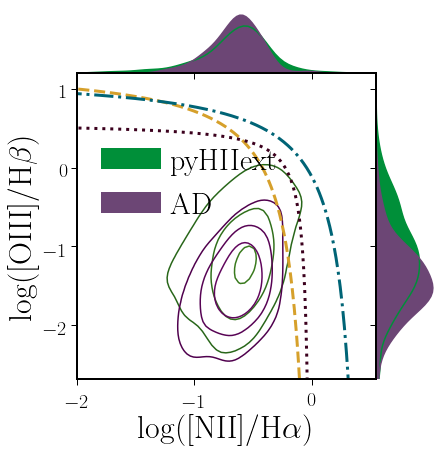

In [100]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(O3_v2.flat)

x_plt2 = np.array(N2_ad.flat)
y_plt2 = np.array(O3_ad.flat)

x_min1=-4
x_max1=0.45
y_min1=-2.7
y_max1=1.2

x=np.linspace(x_min1,x_max1,500)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y5_ce=0.13/(x-0.003)+0.57
cut_y_SII=0.72/(x-0.32)+1.3;
cut_y_SII_ce=0.04/(x+0.012)+0.58
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OI_ce=0.056/(x+0.40)+0.61
cut_y_OIII_AGNs=1.14*(x)+0.36;


maska2 = (x_plt2>=-500)&(x_plt2<=500)& (y_plt2>=-500)&(y_plt2<=500)
maska1 = (x_plt>=-500)&(x_plt<=500)& (y_plt>=-500)&(y_plt<=500)

x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]

df = pd.DataFrame({"x":x_plt,"y":y_plt})


ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0,vmax=20, xlim=[x_min1+2,x_max1+0.1], ylim=[y_min1,y_max1],shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color":'#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])

ax.x = x_plt2
ax.y = y_plt2

ax.plot_joint(sns.kdeplot, cmap='BuPu_r', vmin=0,vmax=20, shade=False,  shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])

ax.ax_joint.plot(x[x<-0.01], cut_y3[x<-0.01], '#D6A02B', linestyle='--', linewidth=3)
ax.ax_joint.plot(x,cut_y4, c='#006476',linestyle='-.',linewidth=3)
ax.ax_joint.plot(x[x<-0.01],cut_y5_ce[x<-0.01],c="#3b001d", linestyle=':',linewidth=3)


ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)',r'log([OIII]/H$\beta$)', size=32)
ax.plot_marginals(sns.kdeplot, color='#6C4675',shade=True, alpha=1)

plt.subplots_adjust(left=0.17, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
plt.legend(['pyHIIext', 'AD'],  loc='3', bbox_to_anchor=(-1.2, 0.85), prop={'size': 30})
plt.savefig(DIR+"bpt_ad.pdf")
plt.savefig(DIR+"bpt_ad.png")

plt.show()

<Figure size 432x288 with 0 Axes>

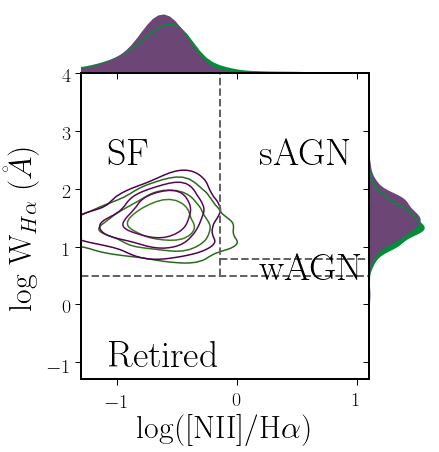

In [101]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(log_EWHa_v2.flat)

x_plt2 = np.array(N2_ad.flat)
y_plt2 = np.array(log_EWHa_ad.flat)

x_min=-1.3
x_max=1.1
y_min=-1.3
y_max=4
        
fig = plt.figure()
    
maska2 = (x_plt2>=-5000)&(x_plt2<=5000)&(y_plt2>=-5000)&(y_plt2<=5000)
maska1 = (x_plt>=-5000)&(x_plt<=5000)&(y_plt>=-5000)&(y_plt<=5000)
x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt = x_plt[maska1]
y_plt = y_plt[maska1]
df = pd.DataFrame({"x":x_plt,"y":y_plt})  
    
ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0, vmax=20, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                 shade_lowest=False, alpha=1, marginal_kws={"color": '#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])
    
ax.x = x_plt2
ax.y = y_plt2
ax.plot_joint(sns.kdeplot, cmap='BuPu_r', vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])
ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)', r'log W$_{H\alpha}$ ($\AA$)', size=32)
ax.plot_marginals(sns.kdeplot, color='#6C4675', shade=True, alpha=1)

ax.ax_joint.plot((-0.14,-0.14), (0.5,y_max) ,c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((-0.14,x_max), (0.79,0.79), c='#646464', ls="--", linewidth=2)
ax.ax_joint.plot((x_min,x_max), (0.5,0.5), c='#646464', ls="--", linewidth=2)

plt.text(0.25, 1.0, 'SF', fontsize=38, fontweight=800,transform=fig.transFigure)
plt.text(0.6, 1.0, 'sAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.6, 0.6, 'wAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.25, 0.3, 'Retired', fontsize=38, fontweight=800, transform=fig.transFigure)

plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)

plt.savefig(DIR+"whan_ad.pdf")
plt.savefig(DIR+"whan_ad.png")

plt.show()


In [102]:
bpt_ad= mpimg.imread(DIR+'bpt_ad.png')
whan_ad= mpimg.imread(DIR+'whan_ad.png')

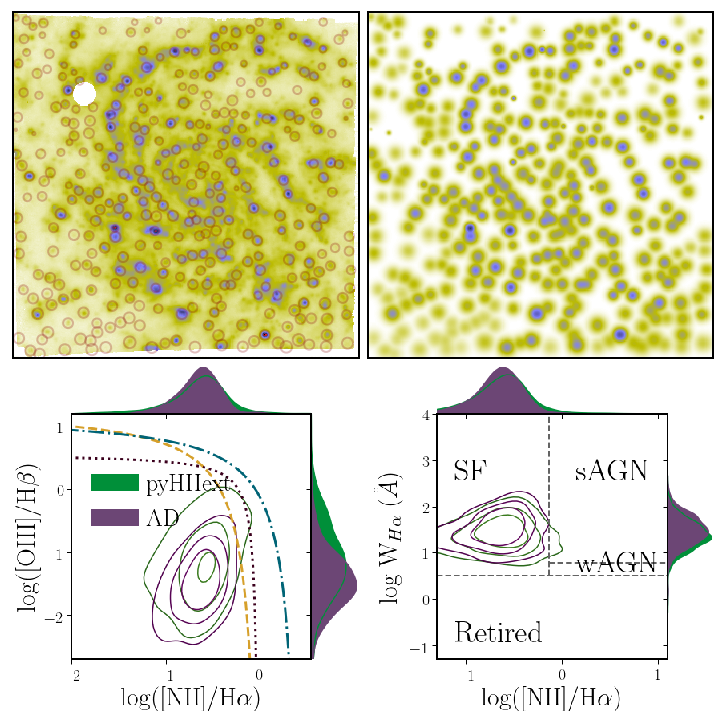

In [103]:
fig, ax = plt.subplots(2,2,figsize=(10,10))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'

#clim=im_Ha_MUSE.properties()['clim']

im_Ha_ad=ax[0][0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
#for leaf in d.leaves:

#    p.plot_contour(ax[0][0], structure=leaf, lw=3, colors='red')

#    s = PPStatistic(leaf)
#    ellipse = s.to_mpl_ellipse(edgecolor='k', facecolor='none')

#    ax[0][0].add_patch(ellipse)
            
for blob in blobs_astrodendro:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0][0].add_patch(c)
        
clim=im_Ha_ad.properties()['clim']

ax[0][1].imshow(image_ad_HII, interpolation='none',cmap=cmap, vmin=0, vmax=10,
                norm=colors.PowerNorm(gamma=0.4) ,clim=clim)

ax[1][0].imshow(bpt_ad, interpolation='none')

ax[1][1].imshow(whan_ad, interpolation='none')
        

ax[1][0].axis('off')
ax[1][1].axis('off')
        
ax[0][0].set_xlim(0,nx)
ax[0][0].set_ylim(0,ny)

ax[0][1].set_xlim(0,nx)
ax[0][1].set_ylim(0,ny)

    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(DIR+'NGC4030'+'_ad.pdf')
plt.savefig(DIR+'NGC4030'+'_ad.png')

plt.show()


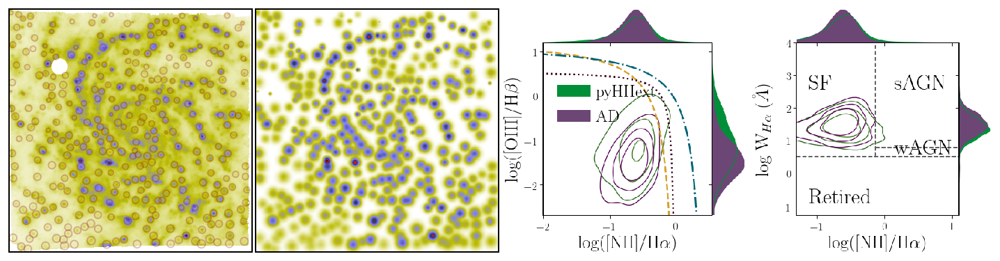

In [104]:
fig, ax = plt.subplots(1,4,figsize=(20,5))

plt.setp(ax, xticks=([]),yticks=([]))
cmap='gist_stern_r'
clim=im_Ha_MUSE.properties()['clim']

ax[0].imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))
        
for blob in blobs_astrodendro:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax[0].add_patch(c)
        
ax[1].imshow(image_ad_HII, interpolation='none',
                cmap=cmap, label=r'Hii regions',
                norm=colors.PowerNorm(gamma=0.4),clim=clim)
        
ax[2].imshow(bpt_ad, interpolation='none')
        
ax[3].imshow(whan_ad, interpolation='none')

ax[2].axis('off')
ax[3].axis('off')

ax[0].set_xlim(0,nx)
ax[0].set_ylim(0,ny)

ax[1].set_xlim(0,nx)
ax[1].set_ylim(0,ny)

        
    
plt.subplots_adjust(left = 0.02, right=1, bottom = 0.02, top=0.99, wspace = 0.01,  hspace = 0.02)
plt.savefig(DIR+'NGC4030'+'_AD'+'.pdf')
plt.savefig(DIR+'NGC4030''_AD'+'.png')

plt.show()


In [105]:
file=output+"CLEAN.seg_Ha.NGC4030.fits.gz"
hdu_seed=fits.open(file)
data_seed=hdu_seed[0].data


cat = source_properties(F_Ha_MUSE, data_seed)

n_obj=0
X=[]
Y=[]
R=[]
for obj in cat:
    n_obj = n_obj+1
    x = obj.xcentroid.value
    y = obj.ycentroid.value
    r = np.sqrt((data_seed[data_seed==n_obj].sum()/n_obj)/3.1416)/1.4
    if  (~((np.isnan(x) or np.isinf(x) or np.isnan(y) or np.isinf(y) or np.isnan(r) or np.isinf(r) ))):
        X.append(x)
        Y.append(y)
        R.append(r)

blobs_v1=np.array((Y,X,R))
blobs_v1=np.swapaxes(blobs_v1,0,1)

blobs_v1[:,2] = blobs_v1[:,2]/np.sqrt(2)




blobs_v1_F_Ha,image_v1_HII,diff_v1_map_final,diff_v1_points,diff_v1_Flux=HIIextraction(F_Ha_MUSE,blobs_v1, 
                                                                                       kind=0,we=0,
                                                                                       FWHM_MUSE = 1, 
                                                                                       refined = 0)


blobs_v1 = blobs_v1[blobs_v1_F_Ha>1]
blobs_v1_F_Ha = blobs_v1_F_Ha[blobs_v1_F_Ha>1]




In [122]:
def radi(x_plt1, y_plt1, 
         x_plt2, y_plt2, 
         x_plt3, y_plt3,
         x_plt4, y_plt4,
         x_plt5, y_plt5,
         cmap1, cmap2, cmap3, cmap4, cmap5, 
         c1, c2, c3, c4, c5,
         x_min, x_max, y_min, y_max, legend, name, DIR):

    fig = plt.figure(figsize=(10,3))
    
    maska5 = (x_plt5>=-50000)&(x_plt5<=50000)&(y_plt5>=-50000)&(y_plt5<=50000)
    maska4 = (x_plt4>=-50000)&(x_plt4<=50000)&(y_plt4>=-50000)&(y_plt4<=50000)
    maska3 = (x_plt3>=-50000)&(x_plt3<=50000)&(y_plt3>=-50000)&(y_plt3<=50000)
    maska2 = (x_plt2>=-50000)&(x_plt2<=50000)&(y_plt2>=-50000)&(y_plt2<=50000)
    maska1 = (x_plt1>=-50000)&(x_plt1<=50000)&(y_plt1>=-50000)&(y_plt1<=50000)
    
    x_plt1 = x_plt1[maska1]
    y_plt1 = y_plt1[maska1]
    x_plt2 = x_plt2[maska2]
    y_plt2 = y_plt2[maska2]
    x_plt3 = x_plt3[maska3]
    y_plt3 = y_plt3[maska3]
    x_plt4 = x_plt4[maska4]
    y_plt4 = y_plt4[maska4]
    x_plt5 = x_plt5[maska5]
    y_plt5 = y_plt5[maska5]
    
    df = pd.DataFrame({"x":x_plt1,"y":y_plt1})
    ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap=cmap1, vmin=0, vmax=20, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color": c1, "alpha": 0.7}, levels=[0.15, 0.5, 0.99])
    
    ax.x = x_plt2
    ax.y = y_plt2
    ax.plot_joint(sns.kdeplot, cmap=cmap2, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
                  levels=[0.15, 0.5, 0.99])
    ax.plot_marginals(sns.kdeplot, color=c2, shade=True, alpha=1)
    
    ax.x = x_plt3
    ax.y = y_plt3
    ax.plot_joint(sns.kdeplot, cmap=cmap3, vmin=20, vmax=30, shade=False, shade_lowest=False, alpha=1, 
                  levels=[0.15, 0.5, 0.99])
    
    ##ax.ax_joint.legend_.remove()
    ax.plot_marginals(sns.kdeplot, color=c3, shade=True, alpha=1)

    
    ax.x = x_plt4
    ax.y = y_plt4
    ax.plot_joint(sns.kdeplot, cmap=cmap4, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
                  levels=[0.15, 0.5, 0.99])
    
    ##ax.ax_joint.legend_.remove()
    ax.plot_marginals(sns.kdeplot, color=c4, shade=True, alpha=1)
    
    ax.x = x_plt5
    ax.y = y_plt5
    ax.plot_joint(sns.kdeplot, cmap=cmap5, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
                  levels=[0.15, 0.5, 0.99])
    
    ##ax.ax_joint.legend_.remove()
    
    ax.plot_marginals(sns.kdeplot, color=c5, shade=True, alpha=1)

       
    ax.set_axis_labels(r'log(flux H$\alpha$/$10^{-16}$ erg/s/cm$^{2}$)', r'log(radius/")', size=30)
    #ax.plot_marginals(sns.kdeplot, color=c2, shade=True, alpha=0.5)
    ax.ax_joint.legend_.remove()
    
    plt.subplots_adjust(top=1, bottom=0.15, left=0.2, right=1, wspace=0, hspace=0)
    plt.legend(legend, bbox_to_anchor=(0.05, 0.23, 0., 0), ncol=2, prop={'size': 17.5}, columnspacing=0.2, 
                 handletextpad=0.1, borderaxespad=-0.2, labelspacing = 0.3)  #
    #plt.tight_layout()
    #plt.text(0.5, 0.3, 'b/a=0.9', fontsize=38, fontweight=800,transform=fig.transFigure)
    plt.savefig(DIR+'/'+name+".png")
    plt.savefig(DIR+'/'+name+".pdf")
    
    plt.show()
    return fig

<Figure size 720x216 with 0 Axes>

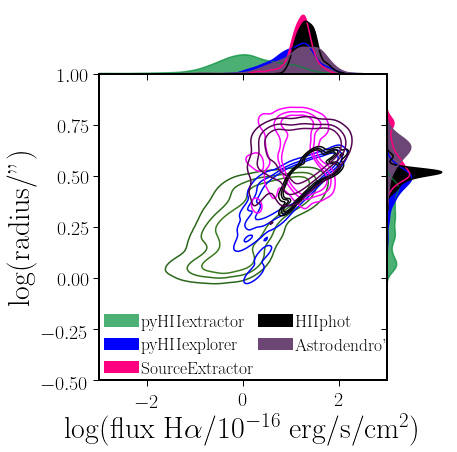

In [123]:
comp_rad=radi(x_plt1=np.log10(blobs_F_Ha), y_plt1=np.log10(blobs_final[:,2]),
              x_plt2=np.log10(blobs_v1_F_Ha), y_plt2=np.log10(blobs_v1[:,2]),
              x_plt3=np.log10(blobs_sew_F_Ha), y_plt3=np.log10(blobs_sew[:,2]), 
              x_plt4=np.log10(blobs_HIIphot_F_Ha), y_plt4=np.log10(blobs_HIIphot[:,2]),
              x_plt5=np.log10(blobs_add_F_Ha), y_plt5=np.log10(blobs_astrodendro[:,2]),
              
              cmap1='PiYG_r', cmap2='winter', cmap3='spring', cmap4='Greys_r', cmap5='BuPu_r',
              c1='#008f39', c2='b', c3='#FF0080', c4='k', c5='#6C4675',
              x_min=-3, x_max=3, y_min=-0.5, y_max=1, legend=['pyHIIextractor','pyHIIexplorer', 'SourceExtractor', 'HIIphot', 'Astrodendro\''], 
              name='frad_all', DIR='/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/')
              


<Figure size 432x288 with 0 Axes>

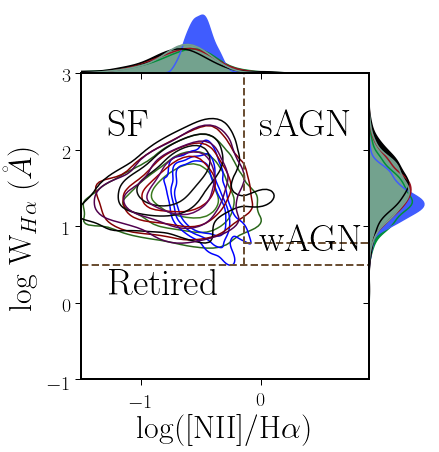

In [108]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(log_EWHa_v2.flat)
x_plt2 = np.array(N2_v1.flat)
y_plt2 = np.array(log_EWHa_v1.flat)
x_plt3 = np.array(N2_se.flat)
y_plt3 = np.array(log_EWHa_se.flat)
x_plt4 = np.array(N2_ph.flat)
y_plt4 = np.array(log_EWHa_ph.flat)
x_plt5 = np.array(N2_ad.flat)
y_plt5 = np.array(log_EWHa_ad.flat)

cmap1='PiYG_r'
cmap2='winter'
cmap3='seismic_r'
cmap4='binary_r'
cmap5='BuPu_r'

c1='#008f39'
c2='#405cfe'
c3='#9B111E'
c4='#000000'
c5='#6C4675'

legend=['pyHIIextractor','pyHIIexplorer', 'SourceExtractor', 'HIIphot', 'Astrodendro']
nameplot='mwhan'
DIR= '/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/'

x_min=-1.5
x_max= 0.9
y_min=-1
y_max=3
        
fig = plt.figure()

maska1 = (x_plt>=-50000)&(x_plt<=50000)&(y_plt>=-50000)&(y_plt<=50000)
maska2 = (x_plt2>=-50000)&(x_plt2<=50000)&(y_plt2>=-50000)&(y_plt2<=50000)
maska3 = (x_plt3>=-50000)&(x_plt3<=50000)&(y_plt3>=-50000)&(y_plt3<=50000)
maska4 = (x_plt4>=-50000)&(x_plt4<=50000)&(y_plt4>=-50000)&(y_plt4<=50000)
maska5 = (x_plt5>=-50000)&(x_plt5<=50000)&(y_plt5>=-50000)&(y_plt5<=50000)

x_plt = x_plt[maska1]
y_plt = y_plt[maska1]
x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt3 = x_plt3[maska3]
y_plt3 = y_plt3[maska3]
x_plt4 = x_plt4[maska4]
y_plt4 = y_plt4[maska4]
x_plt5 = x_plt5[maska5]
y_plt5 = y_plt5[maska5]
df = pd.DataFrame({"x":x_plt,"y":y_plt})  
    
ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0, vmax=20, xlim=[x_min, x_max], ylim=[y_min, y_max], shade=False, 
                 shade_lowest=False, alpha=1, marginal_kws={"color": '#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])
    
ax.x = x_plt2
ax.y = y_plt2
ax.plot_joint(sns.kdeplot, cmap=cmap2, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])
ax.plot_marginals(sns.kdeplot, color=c2, shade=True, alpha=1)

ax.x = x_plt3
ax.y = y_plt3
ax.plot_joint(sns.kdeplot, cmap=cmap3, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
              levels=[0.15, 0.5, 0.99])    
ax.plot_marginals(sns.kdeplot, color=c3, shade=True, alpha=1)

ax.x = x_plt4
ax.y = y_plt4
ax.plot_joint(sns.kdeplot, cmap=cmap4, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
              levels=[0.15, 0.5, 0.99])    
ax.plot_marginals(sns.kdeplot, color=c4, shade=True, alpha=1)


ax.x = x_plt5
ax.y = y_plt5
ax.plot_joint(sns.kdeplot, cmap=cmap5, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
              levels=[0.15, 0.5, 0.99])    
ax.plot_marginals(sns.kdeplot, color=c5, shade=True, alpha=1)


ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)', r'log W$_{H\alpha}$ ($\AA$)', size=32)
ax.plot_marginals(sns.kdeplot, color='#7bffa7', shade=True, alpha=0.5)

ax.ax_joint.plot((-0.14,-0.14), (0.5,y_max) ,c='#6b4f34', ls="--", linewidth=2)
ax.ax_joint.plot((-0.14,x_max), (0.79,0.79), c='#6b4f34', ls="--", linewidth=2)
ax.ax_joint.plot((x_min,x_max), (0.5,0.5), c='#6b4f34', ls="--", linewidth=2)

plt.text(0.25, 1.1, 'SF', fontsize=38, fontweight=800,transform=fig.transFigure)
plt.text(0.6, 1.1, 'sAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.6, 0.7, 'wAGN', fontsize=38, fontweight=800, transform=fig.transFigure)
plt.text(0.25, 0.55, 'Retired', fontsize=38, fontweight=800, transform=fig.transFigure)
#plt.legend(['pyHIIextractor','pyHIIexplorer', 'SourceExtractor', 'HIIphot', 'Astrodendro'],bbox_to_anchor=(-0.1, 0.22, 0., 0), ncol=2, prop={'size': 16}, columnspacing=0.1, 
                 #handletextpad=0.1, borderaxespad=-0.2, labelspacing = 0.3)  #

plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)

plt.savefig("mwhan.png")
plt.savefig("mwhan.pdf")
plt.show()


<Figure size 432x288 with 0 Axes>

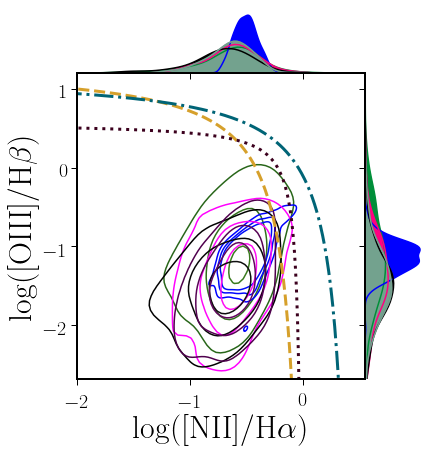

In [109]:
x_plt = np.array(N2_v2.flat)
y_plt = np.array(O3_v2.flat)
x_plt2 = np.array(N2_v1.flat)
y_plt2 = np.array(O3_v1.flat)
x_plt3 = np.array(N2_se.flat)
y_plt3 = np.array(O3_se.flat)
x_plt4 = np.array(N2_ph.flat)
y_plt4 = np.array(O3_ph.flat)
x_plt5 = np.array(N2_ad.flat)
y_plt5 = np.array(O3_ad.flat)

x_min1=-4
x_max1=0.45
y_min1=-2.7
y_max1=1.2

x=np.linspace(x_min1,x_max1,500)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y5_ce=0.13/(x-0.003)+0.57
cut_y_SII=0.72/(x-0.32)+1.3;
cut_y_SII_ce=0.04/(x+0.012)+0.58
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OI_ce=0.056/(x+0.40)+0.61
cut_y_OIII_AGNs=1.14*(x)+0.36;

fig = plt.figure()

maska1 = (x_plt>=-50000)&(x_plt<=50000)&(y_plt>=-50000)&(y_plt<=50000)
maska2 = (x_plt2>=-50000)&(x_plt2<=50000)&(y_plt2>=-50000)&(y_plt2<=50000)
maska3 = (x_plt3>=-50000)&(x_plt3<=50000)&(y_plt3>=-50000)&(y_plt3<=50000)
maska4 = (x_plt4>=-50000)&(x_plt4<=50000)&(y_plt4>=-50000)&(y_plt4<=50000)
maska5 = (x_plt5>=-50000)&(x_plt5<=50000)&(y_plt5>=-50000)&(y_plt5<=50000)

x_plt = x_plt[maska1]
y_plt = y_plt[maska1]
x_plt2 = x_plt2[maska2]
y_plt2 = y_plt2[maska2]
x_plt3 = x_plt3[maska3]
y_plt3 = y_plt3[maska3]
x_plt4 = x_plt4[maska4]
y_plt4 = y_plt4[maska4]
x_plt5 = x_plt5[maska5]
y_plt5 = y_plt5[maska5]

cmap1='PiYG_r'
cmap2='winter'
cmap3='spring'
cmap4='Greys_r'
cmap5='BuPu_r'

c1='#008f39'
c2='b'
c3='#FF0080'
c4='k'
c5='#6C4675'

legend=['pyHIIextractor','pyHIIexplorer', 'SourceExtractor', 'HIIphot', 'Astrodendro']


df = pd.DataFrame({"x":x_plt,"y":y_plt})


ax=sns.jointplot(data=df, x='x', y='y', kind="kde", cmap='PiYG_r', vmin=0,vmax=20, xlim=[x_min1+2,x_max1+0.1], ylim=[y_min1,y_max1],shade=False, 
                   shade_lowest=False, alpha=1, marginal_kws={"color":'#008f39', "alpha": 1}, levels=[0.15, 0.5, 0.99])

ax.x = x_plt2
ax.y = y_plt2
ax.plot_joint(sns.kdeplot, cmap=cmap2, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1 , levels=[0.15, 0.5, 0.99])
ax.plot_marginals(sns.kdeplot, color=c2, shade=True, alpha=1)

ax.x = x_plt3
ax.y = y_plt3
ax.plot_joint(sns.kdeplot, cmap=cmap3, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
              levels=[0.15, 0.5, 0.99])    
ax.plot_marginals(sns.kdeplot, color=c3, shade=True, alpha=1)

ax.x = x_plt4
ax.y = y_plt4
ax.plot_joint(sns.kdeplot, cmap=cmap4, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
              levels=[0.15, 0.5, 0.99])    
ax.plot_marginals(sns.kdeplot, color=c4, shade=True, alpha=1)


ax.x = x_plt5
ax.y = y_plt5
ax.plot_joint(sns.kdeplot,  cmap=cmap5, vmin=0, vmax=20, shade=False, shade_lowest=False, alpha=1, 
              levels=[0.15, 0.5, 0.99])    
ax.plot_marginals(sns.kdeplot, color=c5, shade=True, alpha=1)

ax.ax_joint.plot(x[x<-0.01], cut_y3[x<-0.01], '#D6A02B', linestyle='--', linewidth=3)
ax.ax_joint.plot(x,cut_y4, c='#006476',linestyle='-.',linewidth=3)
ax.ax_joint.plot(x[x<-0.01],cut_y5_ce[x<-0.01],c="#3b001d", linestyle=':',linewidth=3)


ax.ax_joint.legend_.remove()
ax.set_axis_labels(r'log([NII]/H$\alpha$)',r'log([OIII]/H$\beta$)', size=32)
ax.plot_marginals(sns.kdeplot, color='#7bffa7',shade=True, alpha=0.5)

#plt.legend(legend,bbox_to_anchor=(-0.1, 0.22, 0., 0), ncol=2, prop={'size': 16}, columnspacing=0.1, 
#                 handletextpad=0.1, borderaxespad=-0.2, labelspacing = 0.3)  #

plt.subplots_adjust(left=0.2, right=1, top=1, bottom=0.15, wspace=0, hspace=0)
plt.savefig("mbpt.png",  dpi=300)
plt.savefig("mbpt.pdf")
plt.show()

plt.show()

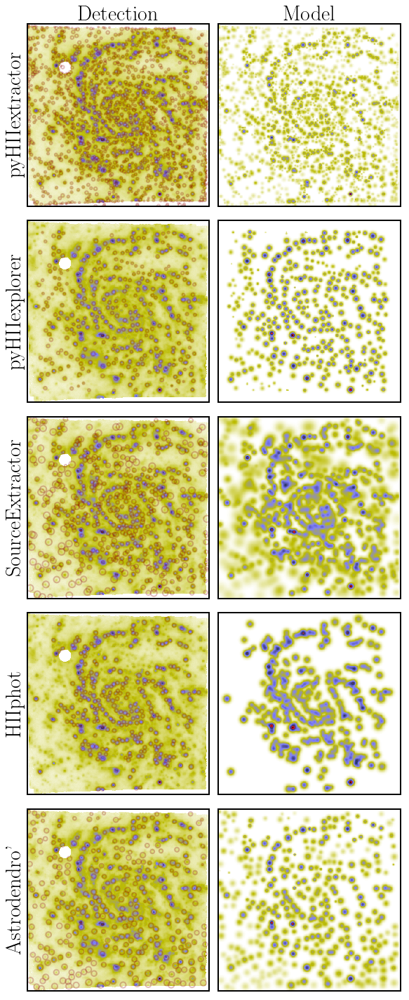

In [110]:
fig = plt.figure(figsize=(9,20))
gs = plt.GridSpec(nrows=5, ncols=2)


ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])

ax5 = fig.add_subplot(gs[2, 0])
ax6 = fig.add_subplot(gs[2, 1])

ax7 = fig.add_subplot(gs[3, 0])
ax8 = fig.add_subplot(gs[3, 1])

ax9 = fig.add_subplot(gs[4, 0])
ax10 = fig.add_subplot(gs[4, 1])


ax1.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))

for blob in blobs_final:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax1.add_patch(c)
    
    
ax2.imshow(image_HII, interpolation='none',
                cmap=cmap, label=r'pyHIIextract',
                norm=colors.PowerNorm(gamma=0.5))  
    
ax3.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))

for blob in blobs_v1:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax3.add_patch(c)


ax4.imshow(image_v1_HII, interpolation='none',
                cmap=cmap, label=r'pyHIIexplorer',
                norm=colors.PowerNorm(gamma=0.5))

ax5.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))


for blob in blobs_sew:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax5.add_patch(c)

ax6.imshow(image_sew_HII, interpolation='none',
                cmap=cmap, label=r'SourceExtractor',
                norm=colors.PowerNorm(gamma=0.6))

ax7.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))


for blob in blobs_HIIphot:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax7.add_patch(c)



ax8.imshow(image_HIIphot_HII, interpolation='none',
                cmap=cmap, label=r'HIIphot',
                norm=colors.PowerNorm(gamma=0.6))

ax9.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))

for blob in blobs_astrodendro:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax9.add_patch(c)

ax10.imshow(image_ad_HII,cmap=cmap,  label=r'AstroDendro',
                norm=colors.PowerNorm(gamma=0.6))


ax1.set_xlim(0,nx)
ax1.set_ylim(0,ny)

ax2.set_xlim(0,nx)
ax2.set_ylim(0,ny)

ax3.set_xlim(0,nx)
ax3.set_ylim(0,ny)

ax4.set_xlim(0,nx)
ax4.set_ylim(0,ny)

ax5.set_xlim(0,nx)
ax5.set_ylim(0,ny)
ax6.set_xlim(0,nx)
ax6.set_ylim(0,ny)

ax7.set_xlim(0,nx)
ax7.set_ylim(0,ny)

ax8.set_xlim(0,nx)
ax8.set_ylim(0,ny)

ax9.set_xlim(0,nx)
ax9.set_ylim(0,ny)

ax10.set_xlim(0,nx)
ax10.set_ylim(0,ny)


ax1.set_yticks([])
ax2.set_yticks([])
ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])
ax9.set_yticks([])
ax10.set_yticks([])



ax1.set_xticks([])
ax2.set_xticks([])
ax3.set_xticks([])
ax4.set_xticks([])
ax5.set_xticks([])
ax6.set_xticks([])
ax7.set_xticks([])
ax8.set_xticks([])
ax9.set_xticks([])
ax10.set_xticks([])


ax1.set_ylabel('pyHIIextractor', size=30)
ax3.set_ylabel('pyHIIexplorer', size=30)
ax5.set_ylabel('SourceExtractor', size=30)
ax7.set_ylabel('HIIphot', size=30)
ax9.set_ylabel('Astrodendro\'', size=30)

ax1.set_title('Detection', size=30)
ax2.set_title('Model', size=30)



plt.tight_layout()


plt.subplots_adjust(left=0.08, right=0.9,  wspace=0.05, hspace=0.05)
plt.savefig("code.pdf", rasterize=True)
plt.savefig("code.png", rasterize=True)

plt.show()

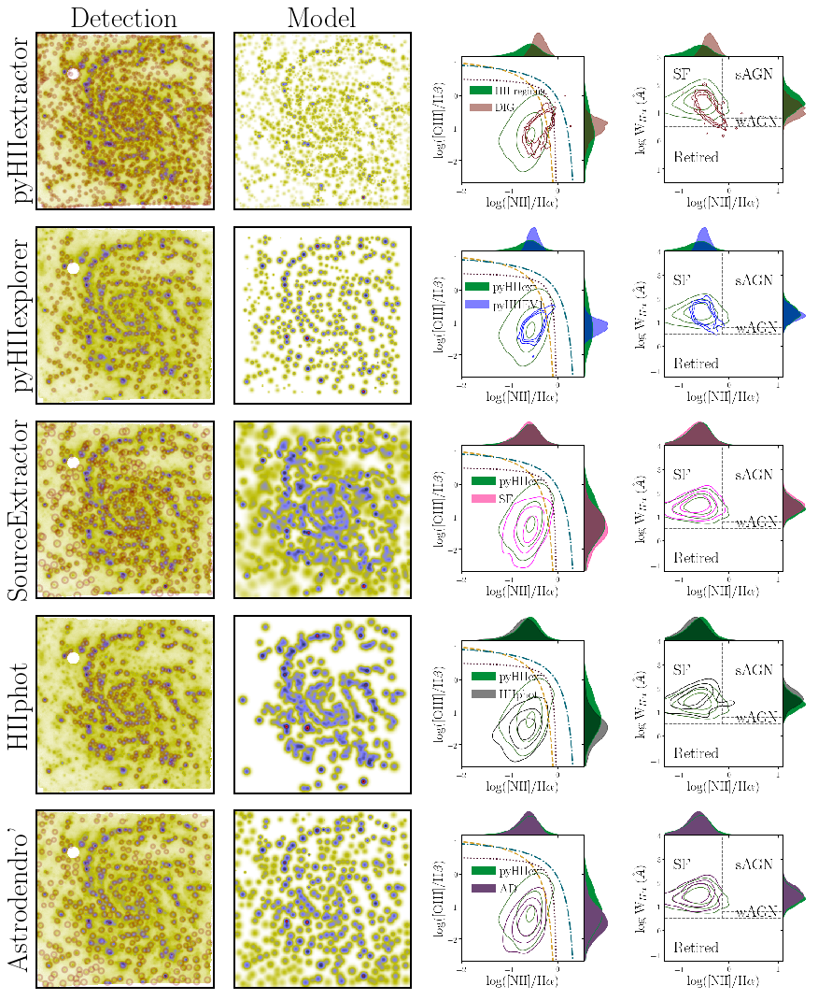

In [111]:
bpt_pyhiiextractor = mpimg.imread('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/bpt_pyhiiv2.png')
whan_pyhiiextractor = mpimg.imread('/home/alugo/Documentos/comp_hiiblob/MUSEW/resultados_muse/test_pyHIIExplorer/whan_pyhiiexplorerv2.png')

fig = plt.figure(figsize=(14,15))
gs = plt.GridSpec(nrows=5, ncols=4)


ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])

ax5 = fig.add_subplot(gs[2, 0])
ax6 = fig.add_subplot(gs[2, 1])

ax7 = fig.add_subplot(gs[3, 0])
ax8 = fig.add_subplot(gs[3, 1])

ax9 = fig.add_subplot(gs[4, 0])
ax10 = fig.add_subplot(gs[4, 1])


ax11 = fig.add_subplot(gs[0, 2])
ax12 = fig.add_subplot(gs[0, 3])

ax13 = fig.add_subplot(gs[1, 2])
ax14 = fig.add_subplot(gs[1, 3])

ax15 = fig.add_subplot(gs[2, 2])
ax16 = fig.add_subplot(gs[2, 3])

ax17 = fig.add_subplot(gs[3, 2])
ax18 = fig.add_subplot(gs[3, 3])

ax19 = fig.add_subplot(gs[4, 2])
ax20 = fig.add_subplot(gs[4, 3])



ax11.imshow(bpt_pyhiiextractor)
ax12.imshow(whan_pyhiiextractor)

ax13.imshow(bpt_v1)
ax14.imshow(whan_v1)
ax16.imshow(whan_se)
ax15.imshow(bpt_se)
ax17.imshow(bpt_phot)
ax18.imshow(whan_phot)
ax19.imshow(bpt_ad)
ax20.imshow(whan_ad)


ax1.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))

for blob in blobs_final:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax1.add_patch(c)
    
    
ax2.imshow(image_HII, interpolation='none',
                cmap=cmap, label=r'pyHIIextract',
                norm=colors.PowerNorm(gamma=0.5))  
    
ax3.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))

#ax3.contour(back_pv1, cmap='Reds', vmin=0, vmax=1, alpha=0.6)


for blob in blobs_v1:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax3.add_patch(c)


ax4.imshow(image_v1_HII, interpolation='none',
                cmap=cmap, label=r'pyHIIexplorer',
                norm=colors.PowerNorm(gamma=0.5))

ax5.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))


for blob in blobs_sew:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax5.add_patch(c)

ax6.imshow(image_sew_HII, interpolation='none',
                cmap=cmap, label=r'SourceExtractor',
                norm=colors.PowerNorm(gamma=0.5))

ax7.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))


for blob in blobs_HIIphot:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax7.add_patch(c)


ax8.imshow(image_HIIphot_HII, interpolation='none',
                cmap=cmap, label=r'HIIphot',
                norm=colors.PowerNorm(gamma=0.5))

ax9.imshow(F_Ha_MUSE, interpolation='none',cmap=cmap, label=r'H$\alpha$',
                norm=colors.PowerNorm(gamma=0.5))


for blob in blobs_astrodendro:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='darkred', linewidth=2, fill=False, alpha=0.25)
    ax9.add_patch(c)

ax10.imshow(image_ad_HII,cmap=cmap,  label=r'AstroDendro',
                norm=colors.PowerNorm(gamma=0.4))



ax11.axis('off')
ax12.axis('off')
ax13.axis('off')
ax14.axis('off')
ax15.axis('off')
ax16.axis('off')
ax17.axis('off')
ax18.axis('off')
ax19.axis('off')
ax20.axis('off')


        
ax1.set_xlim(0,nx)
ax1.set_ylim(0,ny)

ax2.set_xlim(0,nx)
ax2.set_ylim(0,ny)

ax3.set_xlim(0,nx)
ax3.set_ylim(0,ny)

ax4.set_xlim(0,nx)
ax4.set_ylim(0,ny)

ax5.set_xlim(0,nx)
ax5.set_ylim(0,ny)
ax6.set_xlim(0,nx)
ax6.set_ylim(0,ny)

ax7.set_xlim(0,nx)
ax7.set_ylim(0,ny)

ax8.set_xlim(0,nx)
ax8.set_ylim(0,ny)

ax9.set_xlim(0,nx)
ax9.set_ylim(0,ny)

ax10.set_xlim(0,nx)
ax10.set_ylim(0,ny)


ax1.set_yticks([])
ax2.set_yticks([])
ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])
ax9.set_yticks([])
ax10.set_yticks([])
ax11.set_yticks([])
ax12.set_yticks([])
ax13.set_yticks([])
ax15.set_yticks([])
ax16.set_yticks([])
ax17.set_yticks([])
ax18.set_yticks([])
ax19.set_yticks([])
ax20.set_yticks([])



ax1.set_xticks([])
ax2.set_xticks([])
ax3.set_xticks([])
ax4.set_xticks([])
ax5.set_xticks([])
ax6.set_xticks([])
ax7.set_xticks([])
ax8.set_xticks([])
ax9.set_xticks([])
ax10.set_xticks([])
ax11.set_xticks([])
ax12.set_xticks([])
ax13.set_xticks([])
ax15.set_xticks([])
ax16.set_xticks([])
ax17.set_xticks([])
ax18.set_xticks([])
ax19.set_xticks([])
ax20.set_xticks([])



ax1.set_ylabel('pyHIIextractor', size=30)
ax3.set_ylabel('pyHIIexplorer', size=30)
ax5.set_ylabel('SourceExtractor', size=30)
ax7.set_ylabel('HIIphot', size=30)
ax9.set_ylabel('Astrodendro\'', size=30)

ax1.set_title('Detection', size=30)
ax2.set_title('Model', size=30)



plt.tight_layout()


plt.subplots_adjust(left=0.08, right=0.9,  wspace=0.1, hspace=0.1)
plt.savefig("codes.pdf", rasterize=True)
plt.savefig("codes.png", rasterize=True)

plt.show()